In [15]:
1+1

2

In [16]:
import torch
import torch.utils.data
from torchvision import datasets, transforms
import numpy as np
import pandas as pd
from torch import nn, optim

device = 'cuda' if torch.cuda.is_available() else 'cpu'

Train size: 200000
Test size : 40000 (= 4 × 10000 )


In [17]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(0, 1)
])

mnist_dataset_train = datasets.MNIST(
    root='./data', train=True, download=True, transform=transform)
mnist_dataset_test = datasets.MNIST(
    root='./data', train=False, download=True, transform=transform)

batch_size = 128

train_loader = torch.utils.data.DataLoader(
    mnist_dataset_train, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(
    mnist_dataset_test, batch_size=5, shuffle=False)

In [18]:
class DAE(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(784, 512)
        self.fc2 = nn.Linear(512, 256)
        self.fc3 = nn.Linear(256, 128)
        self.fc4 = nn.Linear(128, 256)
        self.fc5 = nn.Linear(256, 512)
        self.fc6 = nn.Linear(512, 784)
        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def encode(self, x):
        h1 = self.relu(self.fc1(x))
        h2 = self.relu(self.fc2(h1))
        return self.relu(self.fc3(h2))

    def decode(self, z):
        h4 = self.relu(self.fc4(z))
        h5 = self.relu(self.fc5(h4))
        return self.sigmoid(self.fc6(h5))

    def forward(self, x):
        q = self.encode(x.view(-1, 784))
        return self.decode(q)

In [27]:
import torch
import torch.nn as nn

class DAE(nn.Module):
    def __init__(self):
        super().__init__()
        # Encoder
        self.fc1 = nn.Linear(784, 512)
        self.fc2 = nn.Linear(512, 256)
        self.fc3 = nn.Linear(256, 128)
        self.fc4 = nn.Linear(128, 64)
        self.fc5 = nn.Linear(64, 32)
        self.fc6 = nn.Linear(32, 16)
        self.fc7 = nn.Linear(16, 8)   # latent layer (8-dim)

        # Decoder (mirror)
        self.fc8  = nn.Linear(8, 16)
        self.fc9  = nn.Linear(16, 32)
        self.fc10 = nn.Linear(32, 64)
        self.fc11 = nn.Linear(64, 128)
        self.fc12 = nn.Linear(128, 256)
        self.fc13 = nn.Linear(256, 512)
        self.fc14 = nn.Linear(512, 784)

        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def encode(self, x):
        h1 = self.relu(self.fc1(x))
        h2 = self.relu(self.fc2(h1))
        h3 = self.relu(self.fc3(h2))
        h4 = self.relu(self.fc4(h3))
        h5 = self.relu(self.fc5(h4))
        h6 = self.relu(self.fc6(h5))
        z  = self.relu(self.fc7(h6))  # latent space (8-dim)
        return z

    def decode(self, z):
        h8  = self.relu(self.fc8(z))
        h9  = self.relu(self.fc9(h8))
        h10 = self.relu(self.fc10(h9))
        h11 = self.relu(self.fc11(h10))
        h12 = self.relu(self.fc12(h11))
        h13 = self.relu(self.fc13(h12))
        out = self.sigmoid(self.fc14(h13))  # output image
        return out

    def forward(self, x):
        q = self.encode(x.view(-1, 784))  # flatten MNIST 28x28
        return self.decode(q)


In [19]:
def train(epoch, model, train_loader, optimizer, cuda=True):
    model.train()
    train_loss = 0
    for batch_idx, (data, _) in enumerate(train_loader):
        data = data.to(device)
        optimizer.zero_grad()
        data_noise = torch.randn(data.shape).to(device)
        data_noise = data + data_noise
        recon_batch = model(data_noise)
        loss = criterion(recon_batch, data.view(data.size(0), -1))
        loss.backward()
        train_loss += loss.item() * len(data)
        optimizer.step()
        if batch_idx % 100 == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(train_loader.dataset),
                100. * batch_idx / len(train_loader),
                loss.item()))
    print('====> Epoch: {} Average loss: {:.4f}'.format(
        epoch, train_loss / len(train_loader.dataset)))

In [28]:
epochs = 10
model = DAE().to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-2)
criterion = nn.MSELoss()

In [31]:
for epoch in range(1, epochs + 1):
    train(epoch, model, train_loader, optimizer, True)

Train Epoch: 1 [0/60000 (0%)]	Loss: 0.058211


Train Epoch: 1 [12800/60000 (21%)]	Loss: 0.055071
Train Epoch: 1 [25600/60000 (43%)]	Loss: 0.055090
Train Epoch: 1 [38400/60000 (64%)]	Loss: 0.061081
Train Epoch: 1 [51200/60000 (85%)]	Loss: 0.056428
====> Epoch: 1 Average loss: 0.0576
Train Epoch: 2 [0/60000 (0%)]	Loss: 0.060028
Train Epoch: 2 [12800/60000 (21%)]	Loss: 0.057106
Train Epoch: 2 [25600/60000 (43%)]	Loss: 0.058243
Train Epoch: 2 [38400/60000 (64%)]	Loss: 0.053511
Train Epoch: 2 [51200/60000 (85%)]	Loss: 0.057399
====> Epoch: 2 Average loss: 0.0566
Train Epoch: 3 [0/60000 (0%)]	Loss: 0.057402
Train Epoch: 3 [12800/60000 (21%)]	Loss: 0.058322
Train Epoch: 3 [25600/60000 (43%)]	Loss: 0.055347
Train Epoch: 3 [38400/60000 (64%)]	Loss: 0.058929
Train Epoch: 3 [51200/60000 (85%)]	Loss: 0.055603
====> Epoch: 3 Average loss: 0.0565
Train Epoch: 4 [0/60000 (0%)]	Loss: 0.058564
Train Epoch: 4 [12800/60000 (21%)]	Loss: 0.060338
Train Epoch: 4 [25600/60000 (43%)]	Loss: 0.058629
Train Epoch: 4 [38400/60000 (64%)]	Loss: 0.061699
Train E

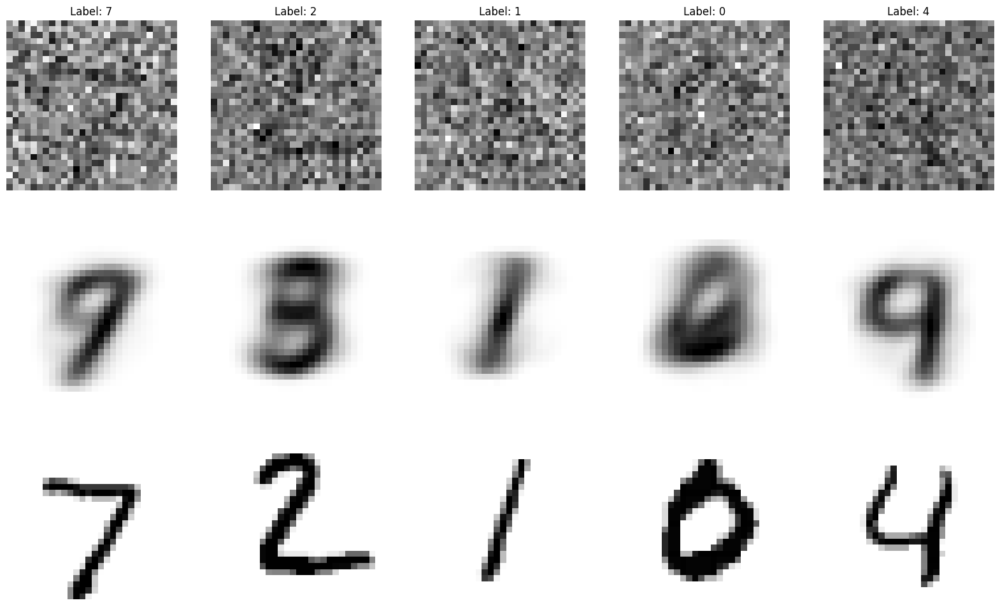

In [33]:
import matplotlib.pyplot as plt

for batch_idx, (data, labels) in enumerate(test_loader):
    data = data.to(device)
    optimizer.zero_grad()
    data_noise = torch.randn(data.shape).to(device)
    data_noise = data + data_noise
    recon_batch = model(data_noise)
    break

plt.figure(figsize=(20, 12))
for i in range(5):
    # print(f" Image {i} with label {labels[i]}", end="")
    plt.subplot(3, 5, 1 + i)
    plt.title(f"Label: {labels[i]}")
    plt.imshow(data_noise[i, :, :, :].view(
        28, 28).cpu().detach().numpy(), cmap='binary')
    plt.axis('off')
    plt.subplot(3, 5, 6 + i)
    plt.imshow(recon_batch[i, :].view(
        28, 28).cpu().detach().numpy(), cmap='binary')
    plt.axis('off')
    plt.subplot(3, 5, 11 + i)
    plt.imshow(data[i, :, :, :].view(
        28, 28).cpu().detach().numpy(), cmap='binary')
    plt.axis('off')
plt.show()

In [47]:
for i in train_loader:
    print(i[0].shape, i[1].shape)
    break

torch.Size([128, 1, 28, 28]) torch.Size([128])


only train on 1's

In [49]:
import numpy as np
import torch
from torchvision import datasets, transforms

# --- transforms (unchanged) ---
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(0, 1)
])

# --- load full MNIST as usual ---
mnist_dataset_train = datasets.MNIST(
    root='./data', train=True, download=True, transform=transform)
mnist_dataset_test = datasets.MNIST(
    root='./data', train=False, download=True, transform=transform)

# --- helper to filter a torchvision MNIST dataset by label(s) ---
def subset_by_labels(ds, keep_labels):
    targets = ds.targets.numpy() if torch.is_tensor(ds.targets) else np.asarray(ds.targets)
    keep = np.isin(targets, np.array(keep_labels))
    indices = np.nonzero(keep)[0]
    return torch.utils.data.Subset(ds, indices)

# --- build subsets ---
# Train: only 1's (from train split)
train_subset = subset_by_labels(mnist_dataset_train, keep_labels=[1])

# Test A (validation): only 1's (from test split)
val_ones_subset = subset_by_labels(mnist_dataset_test, keep_labels=[1])

# Test B (anomaly test): 1,5,9,0 (from test split)
test_mix_subset = subset_by_labels(mnist_dataset_test, keep_labels=[1, 5, 9, 0])

# --- loaders ---
batch_size = 128
train_loader = torch.utils.data.DataLoader(train_subset, batch_size=batch_size, shuffle=True)

# keep your small batch size for tests/visuals
val_loader_ones = torch.utils.data.DataLoader(val_ones_subset, batch_size=5, shuffle=False)
test_loader_mix = torch.utils.data.DataLoader(test_mix_subset, batch_size=5, shuffle=False)

# (optional) quick sanity checks
def count_labels(ds_subset, base_ds_targets):
    idx = ds_subset.indices if isinstance(ds_subset, torch.utils.data.Subset) else np.arange(len(ds_subset))
    t = base_ds_targets.numpy() if torch.is_tensor(base_ds_targets) else np.asarray(base_ds_targets)
    unique, counts = np.unique(t[idx], return_counts=True)
    return dict(zip(unique.tolist(), counts.tolist()))

print("Train label counts:", count_labels(train_subset, mnist_dataset_train.targets))      # should be {1: ...}
print("Val (ones) counts :", count_labels(val_ones_subset, mnist_dataset_test.targets))    # should be {1: ...}
print("Test (mix) counts :", count_labels(test_mix_subset, mnist_dataset_test.targets))    # should be {0:...,1:...,5:...,9:...})


Train label counts: {1: 6742}
Val (ones) counts : {1: 1135}
Test (mix) counts : {0: 980, 1: 1135, 5: 892, 9: 1009}


In [50]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class DAE(nn.Module):
    def __init__(self, latent_dim=8):
        super().__init__()
        self.latent_dim = latent_dim

        # ---- Encoder (conv → flatten → linear → 8-d latent) ----
        # 28x28 → 14x14
        self.enc_conv1 = nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1)
        # 14x14 → 7x7
        self.enc_conv2 = nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1)

        self.enc_fc1 = nn.Linear(64 * 7 * 7, 256)
        self.enc_fc2 = nn.Linear(256, latent_dim)

        # ---- Decoder (8 → linear → reshape → deconv back to 28x28) ----
        self.dec_fc1 = nn.Linear(latent_dim, 256)
        self.dec_fc2 = nn.Linear(256, 64 * 7 * 7)

        # 7x7 → 14x14
        self.dec_deconv1 = nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1)
        # 14x14 → 28x28
        self.dec_deconv2 = nn.ConvTranspose2d(32, 1,  kernel_size=3, stride=2, padding=1, output_padding=1)

        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()

    def encode(self, x):
        # Accept (B,1,28,28) or (B,784)
        if x.dim() == 2 and x.size(1) == 784:
            x = x.view(-1, 1, 28, 28)

        h = self.relu(self.enc_conv1(x))      # (B,32,14,14)
        h = self.relu(self.enc_conv2(h))      # (B,64,7,7)
        h = h.view(h.size(0), -1)             # (B,64*7*7)

        h = self.relu(self.enc_fc1(h))        # (B,256)
        z = self.enc_fc2(h)                   # (B,latent_dim=8)
        return z

    def decode(self, z):
        h = self.relu(self.dec_fc1(z))        # (B,256)
        h = self.relu(self.dec_fc2(h))        # (B,64*7*7)
        h = h.view(-1, 64, 7, 7)              # (B,64,7,7)

        h = self.relu(self.dec_deconv1(h))    # (B,32,14,14)
        x_hat = self.sigmoid(self.dec_deconv2(h))  # (B,1,28,28) in [0,1]
        return x_hat

    def forward(self, x):
        z = self.encode(x)
        x_hat = self.decode(z)
        # If you need a flat 784 output like your old MLP, uncomment:
        # return x_hat.view(x_hat.size(0), -1)
        return x_hat


In [51]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt

# -------------------------
# Training / validation
# -------------------------
def train_one_epoch(epoch, model, train_loader, optimizer, criterion, device,
                    noise_std=0.25, log_interval=100):
    model.train()
    running_loss = 0.0
    num_samples = 0

    for batch_idx, (data, _) in enumerate(train_loader):
        data = data.to(device)                     # (B,1,28,28)
        # add Gaussian noise for denoising AE
        noisy = data + noise_std * torch.randn_like(data)
        noisy = torch.clamp(noisy, 0.0, 1.0)       # keep in [0,1] since target is [0,1]

        optimizer.zero_grad()
        recon = model(noisy)                       # (B,1,28,28)
        loss = criterion(recon, data)              # compare to clean target
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * data.size(0)
        num_samples += data.size(0)

        if batch_idx % log_interval == 0:
            print(f"Train Epoch: {epoch} [{batch_idx * len(data)}/{len(train_loader.dataset)} "
                  f"({100. * batch_idx / max(1, len(train_loader)):.0f}%)]\tLoss: {loss.item():.6f}")

    avg = running_loss / max(1, num_samples)
    print(f"====> Epoch: {epoch} Train Avg loss: {avg:.6f}")
    return avg


@torch.no_grad()
def evaluate(model, loader, criterion, device, noise_std=None):
    """
    If noise_std is None, no noise is added (clean recon loss).
    If noise_std is a float, denoising loss is measured (noisy input → clean target).
    """
    model.eval()
    total_loss = 0.0
    num_samples = 0

    for data, _ in loader:
        data = data.to(device)
        if noise_std is None:
            inp = data
        else:
            inp = torch.clamp(data + noise_std * torch.randn_like(data), 0.0, 1.0)

        recon = model(inp)
        loss = criterion(recon, data)              # always measure vs clean
        total_loss += loss.item() * data.size(0)
        num_samples += data.size(0)

    return total_loss / max(1, num_samples)



In [54]:

# -------------------------
# Usage
# -------------------------
# epochs = 10
model = DAE().to(device)                           # your conv+linear DAE
optimizer = optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-4)  # add mild WD
epochs = 30

criterion = nn.MSELoss()

# pick your validation loader of only 1's (from earlier code)
# e.g., val_loader_ones
# If you haven't created it yet, just pass mnist 1's from the test split.

train_losses, val_losses = [], []
train_noise_std = 0.25         # noise level during training
val_noise_std   = 0.25         # match training to monitor denoising; set to None for clean recon loss

for epoch in range(1, epochs + 1):
    tr = train_one_epoch(epoch, model, train_loader, optimizer, criterion,
                         device, noise_std=train_noise_std, log_interval=100)
    va = evaluate(model, val_loader_ones, criterion, device, noise_std=val_noise_std)
    train_losses.append(tr)
    val_losses.append(va)
    print(f"====> Epoch: {epoch} Validation loss: {va:.6f}")


Train Epoch: 1 [0/6742 (0%)]	Loss: 0.222284
====> Epoch: 1 Train Avg loss: 0.059859
====> Epoch: 1 Validation loss: 0.030716
Train Epoch: 2 [0/6742 (0%)]	Loss: 0.030316
====> Epoch: 2 Train Avg loss: 0.023485
====> Epoch: 2 Validation loss: 0.016276
Train Epoch: 3 [0/6742 (0%)]	Loss: 0.017394
====> Epoch: 3 Train Avg loss: 0.014714
====> Epoch: 3 Validation loss: 0.013286
Train Epoch: 4 [0/6742 (0%)]	Loss: 0.012176
====> Epoch: 4 Train Avg loss: 0.011945
====> Epoch: 4 Validation loss: 0.010047
Train Epoch: 5 [0/6742 (0%)]	Loss: 0.010087
====> Epoch: 5 Train Avg loss: 0.010220
====> Epoch: 5 Validation loss: 0.009029
Train Epoch: 6 [0/6742 (0%)]	Loss: 0.009345
====> Epoch: 6 Train Avg loss: 0.008537
====> Epoch: 6 Validation loss: 0.007155
Train Epoch: 7 [0/6742 (0%)]	Loss: 0.006842
====> Epoch: 7 Train Avg loss: 0.007673
====> Epoch: 7 Validation loss: 0.006989
Train Epoch: 8 [0/6742 (0%)]	Loss: 0.008061
====> Epoch: 8 Train Avg loss: 0.007553
====> Epoch: 8 Validation loss: 0.006879


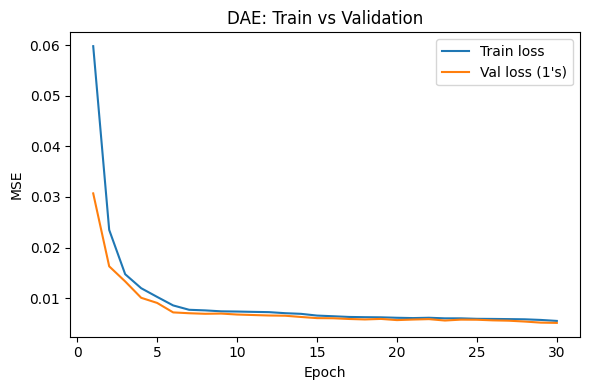

In [55]:
plt.figure(figsize=(6,4))
plt.plot(range(1, epochs+1), train_losses, label="Train loss")
plt.plot(range(1, epochs+1), val_losses,   label="Val loss (1's)")
plt.xlabel("Epoch")
plt.ylabel("MSE")
plt.title("DAE: Train vs Validation")
plt.legend()
plt.tight_layout()
plt.show()

Batch MSE: 0.004352 | PSNR: 24.30 dB


/tmp/ipykernel_3065300/86917286.py:51: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.96])


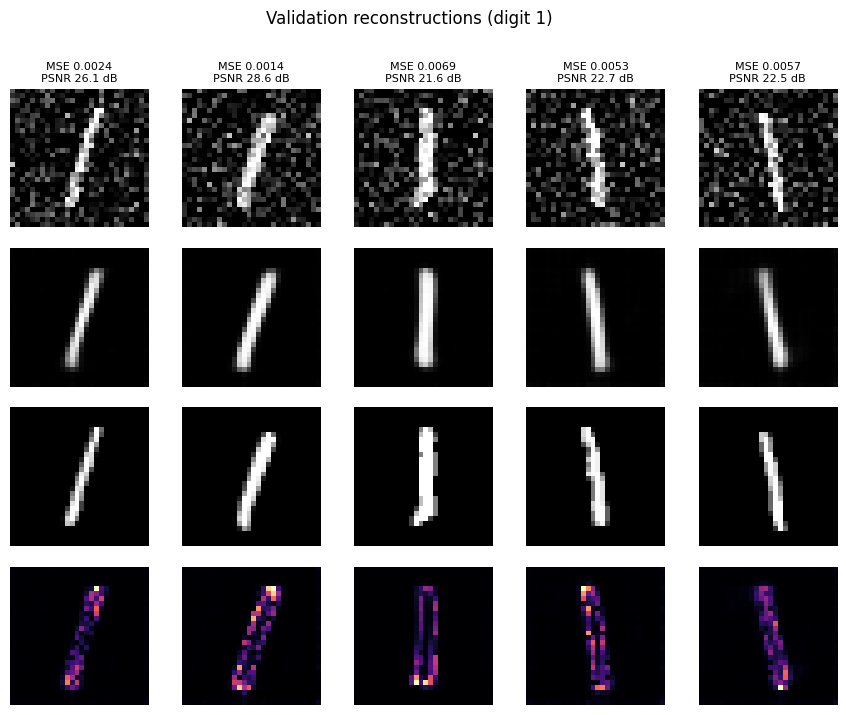

In [61]:
import torch, matplotlib.pyplot as plt

@torch.no_grad()
def show_val_recons(model, loader, device, noise_std=0.25, n=8, seed=None, title=None,
                    row_labels=("original", "recon", "signal (clean)", "residual")):
    model.eval()

    clean, _ = next(iter(loader))          # (B,1,28,28) in [0,1]
    clean = clean.to(device)

    # input (original) view
    if not noise_std:
        noisy = clean
        row0 = f"{row_labels[0]} (clean)"
    else:
        g = torch.Generator(device=device).manual_seed(int(seed)) if seed is not None else None
        noise = torch.randn(clean.shape, device=device, generator=g) if g else torch.randn(clean.shape, device=device)
        noisy = (clean + noise_std * noise).clamp(0, 1)
        row0 = f"{row_labels[0]} (noisy σ={noise_std})"

    recon = model(noisy)

    # metrics
    mse_per  = ((recon - clean) ** 2).mean(dim=(1,2,3))
    psnr_per = -10.0 * torch.log10(mse_per.clamp_min(1e-12))
    print(f"Batch MSE: {mse_per.mean().item():.6f} | PSNR: {psnr_per.mean().item():.2f} dB")

    # plot
    k = min(n, clean.size(0))
    fig, axes = plt.subplots(4, k, figsize=(2.2*k, 8),
                             gridspec_kw={'wspace':0.05, 'hspace':0.15})

    for i in range(k):
        # top row: show noisy and put the per-sample title here
        axes[0, i].imshow(noisy[i, 0].detach().cpu().numpy(), cmap='gray');   axes[0, i].axis('off')
        axes[0, i].set_title(f"MSE {mse_per[i].item():.4f}\nPSNR {psnr_per[i].item():.1f} dB",
                             fontsize=8, pad=6)

        axes[1, i].imshow(recon[i, 0].detach().cpu().numpy(), cmap='gray');   axes[1, i].axis('off')
        axes[2, i].imshow(clean[i, 0].detach().cpu().numpy(), cmap='gray');   axes[2, i].axis('off')
        resid = (clean[i] - recon[i]).abs()[0].detach().cpu().numpy()
        axes[3, i].imshow(resid, cmap='magma');                                axes[3, i].axis('off')

    # left-side row labels
    axes[0, 0].set_ylabel(row0,                fontsize=12, rotation=90, labelpad=20)
    axes[1, 0].set_ylabel(row_labels[1],       fontsize=12, rotation=90, labelpad=20)
    axes[2, 0].set_ylabel(row_labels[2],       fontsize=12, rotation=90, labelpad=20)
    axes[3, 0].set_ylabel(row_labels[3],       fontsize=12, rotation=90, labelpad=20)

    if title: fig.suptitle(title, y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# example call
show_val_recons(model, val_loader_ones, device, noise_std=0.25, n=10, seed=123,
                title="Validation reconstructions (digit 1)")



/tmp/ipykernel_3065300/2511804683.py:69: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,1,0.96])


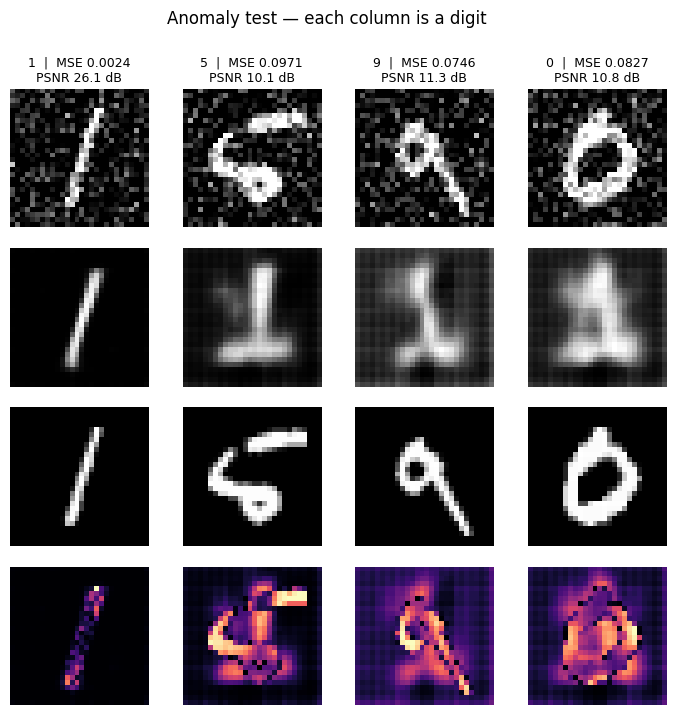

In [62]:
import torch, matplotlib.pyplot as plt

@torch.no_grad()
def show_by_class_columns(model, loader, device, class_order=(1,5,9,0),
                          noise_std=0.25, seed=None, title=None):
    """
    Finds one sample per label in class_order from `loader` and displays:
        Row 1: original (noisy if noise_std>0)  [titles here]
        Row 2: reconstruction
        Row 3: signal (clean target)
        Row 4: residual |clean - recon|
    Columns correspond to labels in class_order.
    """
    model.eval()

    # ---- collect one example per requested class ----
    picked = {}
    for imgs, labels in loader:
        for i in range(imgs.size(0)):
            lab = int(labels[i])
            if lab in class_order and lab not in picked:
                picked[lab] = imgs[i:i+1]  # keep batch dim
                if len(picked) == len(class_order):
                    break
        if len(picked) == len(class_order):
            break

    labs_present = [lab for lab in class_order if lab in picked]
    if not labs_present:
        raise RuntimeError("None of the requested labels were found in the loader.")
    clean = torch.cat([picked[lab] for lab in labs_present], dim=0).to(device)  # (C,1,28,28)

    # ---- make noisy view (reproducible if seed set) ----
    if noise_std and noise_std > 0:
        g = torch.Generator(device=device).manual_seed(int(seed)) if seed is not None else None
        noise = torch.randn(clean.shape, device=device, generator=g) if g else torch.randn(clean.shape, device=device)
        noisy = (clean + noise_std * noise).clamp(0, 1)
        row0 = f"original (noisy σ={noise_std})"
    else:
        noisy = clean
        row0 = "original (clean)"

    # ---- forward & metrics ----
    recon = model(noisy)
    mse   = ((recon - clean)**2).mean(dim=(1,2,3))
    psnr  = -10.0 * torch.log10(mse.clamp_min(1e-12))

    # ---- plot ----
    C = len(labs_present)
    fig, axes = plt.subplots(4, C, figsize=(2.2*C, 8),
                             gridspec_kw={'wspace':0.05, 'hspace':0.15})
    for j, lab in enumerate(labs_present):
        axes[0, j].imshow(noisy[j, 0].detach().cpu().numpy(), cmap='gray');   axes[0, j].axis('off')
        axes[0, j].set_title(f"{lab}  |  MSE {mse[j]:.4f}\nPSNR {psnr[j]:.1f} dB",
                             fontsize=9, pad=6)

        axes[1, j].imshow(recon[j, 0].detach().cpu().numpy(), cmap='gray');   axes[1, j].axis('off')
        axes[2, j].imshow(clean[j, 0].detach().cpu().numpy(), cmap='gray');   axes[2, j].axis('off')
        resid = (clean[j] - recon[j]).abs()[0].detach().cpu().numpy()
        axes[3, j].imshow(resid, cmap='magma');                                axes[3, j].axis('off')

    # left-side row labels
    axes[0, 0].set_ylabel(row0,              fontsize=12, rotation=90, labelpad=20)
    axes[1, 0].set_ylabel("recon",           fontsize=12, rotation=90, labelpad=20)
    axes[2, 0].set_ylabel("signal (clean)",  fontsize=12, rotation=90, labelpad=20)
    axes[3, 0].set_ylabel("residual",        fontsize=12, rotation=90, labelpad=20)

    if title: fig.suptitle(title, y=0.98)
    plt.tight_layout(rect=[0,0,1,0.96])
    plt.show()

# Example call (columns: 1, 5, 9, 0)
show_by_class_columns(model, test_loader_mix, device,
                      class_order=(1,5,9,0), noise_std=0.25, seed=123,
                      title="Anomaly test — each column is a digit")


In [63]:
import numpy as np, torch, matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# ─────────────────────────────────────────────────────────────────────────────
# 1) Collect latents from a DataLoader (optionally add noise to inputs)
# ─────────────────────────────────────────────────────────────────────────────
@torch.no_grad()
def collect_latents(model, loader, device, noise_std=None, max_per_class=None, seed=0):
    """
    Returns:
      Z      : (N, d) numpy array of latents
      labels : (N,)   numpy int labels
    """
    model.eval()
    rng = np.random.default_rng(int(seed))

    Zs, Ls = [], []
    per_class_kept = {}

    for x, y in loader:
        x = x.to(device)
        if noise_std is not None and noise_std > 0:
            # (compatible with older torch: no generator kw on randn_like)
            noise = torch.randn(x.shape, device=device)
            x = (x + noise_std * noise).clamp(0, 1)

        z = model.encode(x)                 # (B, latent_dim)
        z = z.detach().cpu().numpy()
        y = y.detach().cpu().numpy()

        if max_per_class is not None:
            # keep at most max_per_class per label
            keep_mask = np.zeros_like(y, dtype=bool)
            for lab in np.unique(y):
                idx = np.where(y == lab)[0]
                left = max(0, max_per_class - per_class_kept.get(lab, 0))
                if left > 0:
                    if len(idx) > left:
                        idx = rng.choice(idx, size=left, replace=False)
                    keep_mask[idx] = True
                    per_class_kept[lab] = per_class_kept.get(lab, 0) + len(idx)
            z, y = z[keep_mask], y[keep_mask]

        Zs.append(z); Ls.append(y)

    Z = np.concatenate(Zs, axis=0) if Zs else np.empty((0, model.latent_dim))
    labels = np.concatenate(Ls, axis=0) if Ls else np.empty((0,), dtype=int)
    return Z, labels


In [64]:


# ─────────────────────────────────────────────────────────────────────────────
# 2) Corner plot (scatter-matrix) coloured by class
# ─────────────────────────────────────────────────────────────────────────────
def corner_plot_by_class(Z, labels, class_order=None, bins=40, subsample=10_000,
                         title=None, savepath=None):
    """
    Z: (N, d) numpy array
    labels: (N,) ints (e.g., digits)
    class_order: sequence of labels to plot order & legend order; if None uses sorted unique
    """
    Z = np.asarray(Z); labels = np.asarray(labels)
    N, d = Z.shape
    dim_labels = [f"z{i}" for i in range(d)]

    uniq = np.unique(labels).tolist()
    if class_order is None:
        class_order = sorted(uniq)
    else:
        class_order = [c for c in class_order if c in uniq]

    # Okabe–Ito palette (CVD-safe)
    OI = ["#0072B2", "#009E73", "#D55E00", "#E69F00", "#56B4E9",
          "#CC79A7", "#000000", "#F0E442", "#999999", "#009E73"]
    # map label -> colour/marker
    colour_map = {lab: OI[i % len(OI)] for i, lab in enumerate(class_order)}
    markers = ["o","s","^","P","D","X","v","<",">","*"]
    marker_map = {lab: markers[i % len(markers)] for i, lab in enumerate(class_order)}

    def c(lbl): return colour_map.get(lbl, "#666666")
    def m(lbl): return marker_map.get(lbl, "o")

    fig, axes = plt.subplots(d, d, figsize=(3.1 * d, 3.1 * d),
                             subplot_kw={'facecolor': 'whitesmoke'})
    plt.subplots_adjust(wspace=0.05, hspace=0.05)

    rng = np.random.default_rng(0)

    for i in range(d):
        for j in range(d):
            ax = axes[i, j]

            if i == j:
                # Diagonal: per-class density hist (step)
                for lab in class_order:
                    data_i = Z[labels == lab, i]
                    if data_i.size == 0: 
                        continue
                    ax.hist(data_i, bins=bins, density=True, histtype='step',
                            color=c(lab), linewidth=1.2)
                ax.set_ylabel(''); ax.set_yticks([])

            elif i > j:
                # Lower triangle: scatter per class (with subsampling for speed)
                for lab in class_order:
                    mask = (labels == lab)
                    idx = np.where(mask)[0]
                    if idx.size == 0: 
                        continue
                    if idx.size > subsample:
                        idx = rng.choice(idx, size=subsample, replace=False)
                    ax.scatter(Z[idx, j], Z[idx, i],
                               s=10 if len(idx) >= subsample else 16,
                               alpha=0.25 if len(idx) >= subsample else 0.6,
                               color=c(lab), marker=m(lab),
                               edgecolors='white', linewidths=0.25,
                               rasterized=True, zorder=3)
            else:
                ax.axis('off')

            # Outer labels only
            if i == d - 1 and j <= i:
                ax.set_xlabel(dim_labels[j])
            else:
                ax.set_xticks([])
            if j == 0 and i != 0:
                ax.set_ylabel(dim_labels[i])
            else:
                ax.set_yticks([])

    # Legend in a safe cell
    legend_row, legend_col = min(3, d-1), min(4, d-1)
    legend_ax = axes[legend_row, legend_col]
    legend_ax.axis('off')
    handles = [Line2D([], [], linestyle='', marker=m(lab), markersize=9,
                      markeredgecolor='white', color=c(lab), label=str(lab))
               for lab in class_order]
    legend_ax.legend(handles=handles, title='Class', loc='center left',
                     bbox_to_anchor=(0.0, 0.5), frameon=False, ncol=1)

    if title: fig.suptitle(title, y=0.98)
    plt.tight_layout(rect=[0,0,1,0.97])
    if savepath:
        plt.savefig(savepath, bbox_inches='tight')
    plt.show()



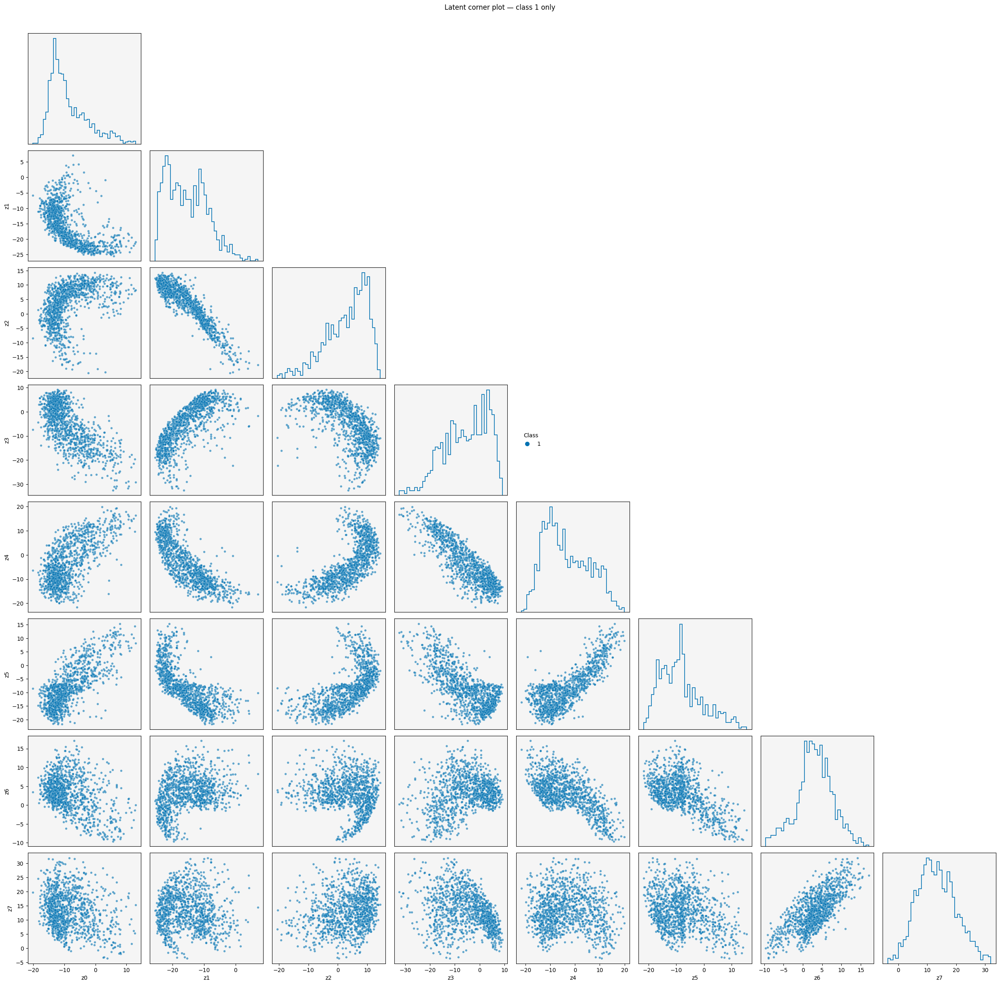

In [65]:

# ─────────────────────────────────────────────────────────────────────────────
# 3) Example usage
# ─────────────────────────────────────────────────────────────────────────────
# a) Only 1's (clean latent structure)
Z1, y1 = collect_latents(model, val_loader_ones, device, noise_std=None, max_per_class=None)
corner_plot_by_class(Z1, y1, class_order=[1],
                     title="Latent corner plot — class 1 only", savepath="corner_latent_ones.pdf")


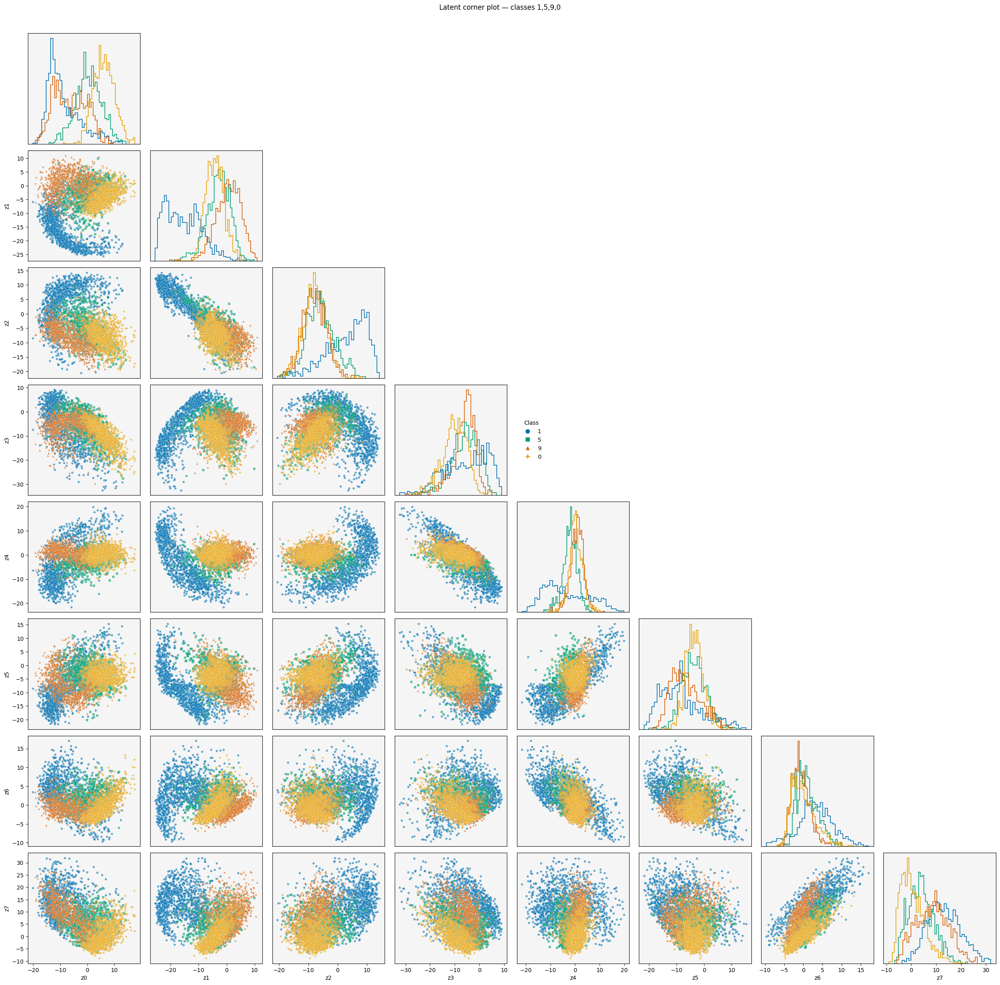

In [66]:

# b) Mixed anomalies (1,5,9,0) — columns already used for images; now latents
Zm, ym = collect_latents(model, test_loader_mix, device, noise_std=None, max_per_class=20_000)
corner_plot_by_class(Zm, ym, class_order=[1,5,9,0],
                     title="Latent corner plot — classes 1,5,9,0", savepath="corner_latent_mix.pdf")


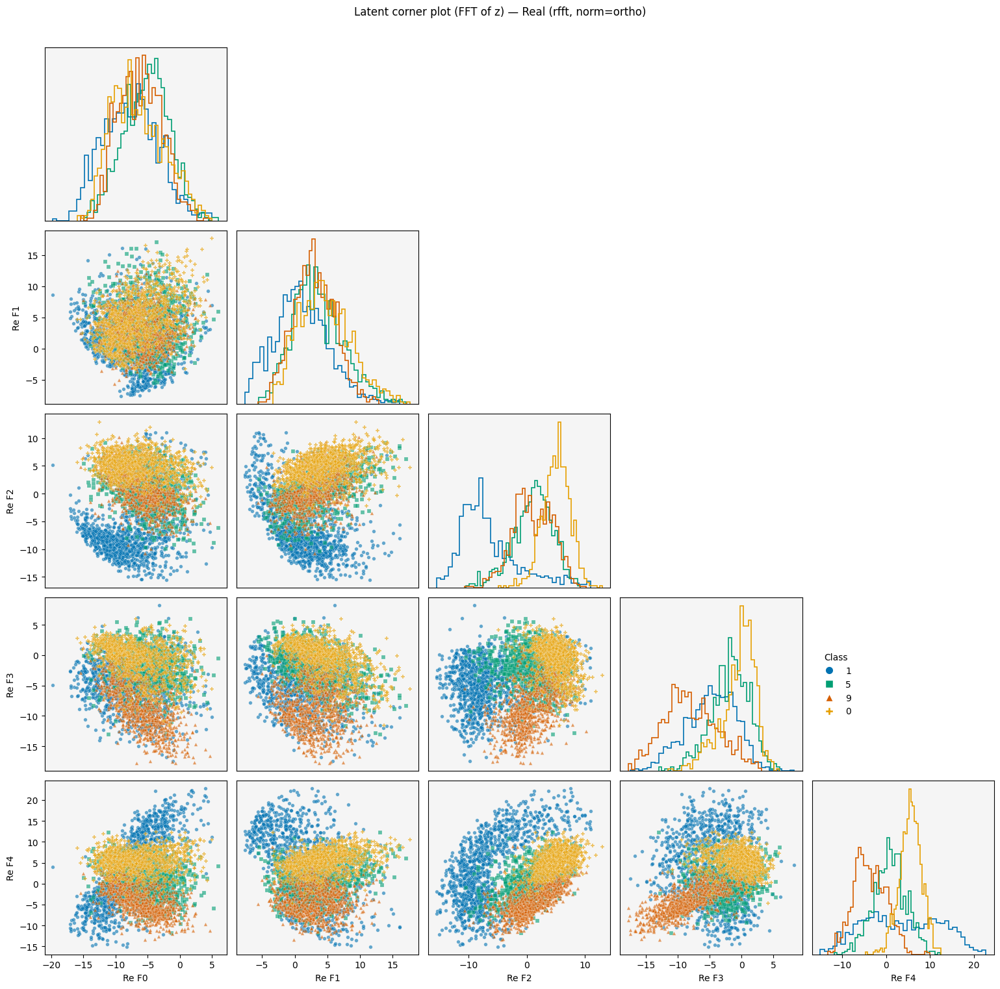

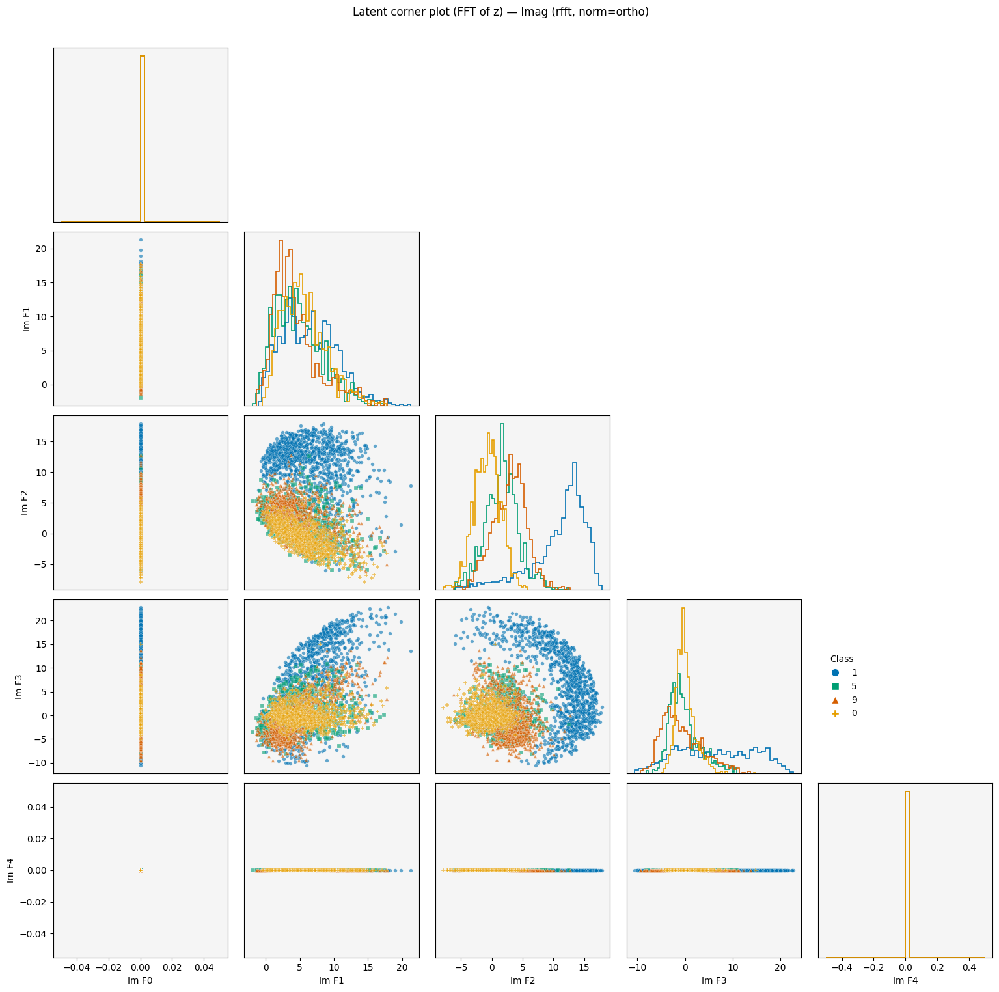

In [67]:
import numpy as np, torch, matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# ─────────────────────────────────────────────────────────────────────────────
# Collect latents (reuse from before)
# ─────────────────────────────────────────────────────────────────────────────
@torch.no_grad()
def collect_latents(model, loader, device, noise_std=None, max_per_class=None, seed=0):
    model.eval()
    rng = np.random.default_rng(int(seed))
    Zs, Ls, kept = [], [], {}

    for x, y in loader:
        x = x.to(device)
        if noise_std and noise_std > 0:
            x = (x + noise_std * torch.randn_like(x)).clamp(0, 1)
        z = model.encode(x).detach().cpu().numpy()
        y = y.detach().cpu().numpy()

        if max_per_class is not None:
            mask = np.zeros_like(y, dtype=bool)
            for lab in np.unique(y):
                idx = np.where(y == lab)[0]
                left = max(0, max_per_class - kept.get(lab, 0))
                if left > 0:
                    if len(idx) > left:
                        idx = rng.choice(idx, size=left, replace=False)
                    mask[idx] = True
                    kept[lab] = kept.get(lab, 0) + len(idx)
            z, y = z[mask], y[mask]

        Zs.append(z); Ls.append(y)

    Z = np.concatenate(Zs, axis=0)
    labels = np.concatenate(Ls, axis=0)
    return Z, labels

# ─────────────────────────────────────────────────────────────────────────────
# Corner plot with optional custom dimension names
# ─────────────────────────────────────────────────────────────────────────────
def corner_plot_by_class(Z, labels, class_order=None, bins=40, subsample=10_000,
                         title=None, savepath=None, dim_names=None):
    Z = np.asarray(Z); labels = np.asarray(labels)
    N, d = Z.shape
    if dim_names is None:
        dim_names = [f"z{i}" for i in range(d)]

    uniq = sorted(np.unique(labels).tolist())
    class_order = [c for c in (class_order or uniq) if c in uniq]

    # Okabe–Ito palette + markers
    OI = ["#0072B2","#009E73","#D55E00","#E69F00","#56B4E9",
          "#CC79A7","#000000","#F0E442","#999999","#009E73"]
    colours = {lab: OI[i % len(OI)] for i, lab in enumerate(class_order)}
    markers = ["o","s","^","P","D","X","v","<",">","*"]
    markmap = {lab: markers[i % len(markers)] for i, lab in enumerate(class_order)}

    fig, axes = plt.subplots(d, d, figsize=(3.1*d, 3.1*d),
                             subplot_kw={'facecolor': 'whitesmoke'})
    plt.subplots_adjust(wspace=0.05, hspace=0.05)
    rng = np.random.default_rng(0)

    for i in range(d):
        for j in range(d):
            ax = axes[i, j]
            if i == j:
                for lab in class_order:
                    data_i = Z[labels == lab, i]
                    if data_i.size:
                        ax.hist(data_i, bins=bins, density=True, histtype='step',
                                color=colours[lab], linewidth=1.2)
                ax.set_yticks([])
            elif i > j:
                for lab in class_order:
                    idx = np.where(labels == lab)[0]
                    if idx.size == 0: 
                        continue
                    if idx.size > subsample:
                        idx = rng.choice(idx, size=subsample, replace=False)
                    ax.scatter(Z[idx, j], Z[idx, i],
                               s=10 if len(idx) >= subsample else 16,
                               alpha=0.25 if len(idx) >= subsample else 0.6,
                               color=colours[lab], marker=markmap[lab],
                               edgecolors='white', linewidths=0.25, rasterized=True, zorder=3)
            else:
                ax.axis('off')

            if i == d-1 and j <= i:
                ax.set_xlabel(dim_names[j])
            else:
                ax.set_xticks([])
            if j == 0 and i != 0:
                ax.set_ylabel(dim_names[i])
            else:
                ax.set_yticks([])

    # legend
    legend_row, legend_col = min(3, d-1), min(4, d-1)
    L = axes[legend_row, legend_col]; L.axis('off')
    handles = [Line2D([], [], linestyle='', marker=markmap[lab], markersize=9,
                      markeredgecolor='white', color=colours[lab], label=str(lab))
               for lab in class_order]
    L.legend(handles=handles, title='Class', loc='center left',
             bbox_to_anchor=(0.0, 0.5), frameon=False, ncol=1)

    if title: fig.suptitle(title, y=0.98)
    plt.tight_layout(rect=[0,0,1,0.97])
    if savepath:
        plt.savefig(savepath, bbox_inches='tight')
    plt.show()

# ─────────────────────────────────────────────────────────────────────────────
# 3) FFT of latents and plots for Real/Imag
# ─────────────────────────────────────────────────────────────────────────────
def fft_latent_corner_plots(model, loader, device, class_order=None,
                            use_rfft=True, norm='ortho', standardize=False,
                            noise_std=None, max_per_class=20_000,
                            title_prefix="Latent FFT", save_prefix=None):
    # collect latents
    Z, y = collect_latents(model, loader, device, noise_std=noise_std,
                           max_per_class=max_per_class, seed=0)

    # FFT along feature axis
    if use_rfft:
        Zc = np.fft.rfft(Z, axis=1, norm=norm)   # length = d//2 + 1
        freqs = range(Zc.shape[1])
        base_name = "rfft"
    else:
        Zc = np.fft.fft(Z, axis=1, norm=norm)    # length = d
        freqs = range(Zc.shape[1])
        base_name = "fft"

    Zr = Zc.real
    Zi = Zc.imag

    # Optional standardization (per-dimension)
    if standardize:
        def zscore(A):
            mu = A.mean(axis=0, keepdims=True)
            sd = A.std(axis=0, keepdims=True) + 1e-8
            return (A - mu) / sd
        Zr = zscore(Zr); Zi = zscore(Zi)

    # dimension labels
    real_names = [f"Re F{k}" for k in freqs]
    imag_names = [f"Im F{k}" for k in freqs]

    # Corner plots
    corner_plot_by_class(
        Zr, y, class_order=class_order, dim_names=real_names,
        title=f"{title_prefix} — Real ({base_name}, norm={norm})",
        savepath=(f"{save_prefix}_real_{base_name}.pdf" if save_prefix else None)
    )
    corner_plot_by_class(
        Zi, y, class_order=class_order, dim_names=imag_names,
        title=f"{title_prefix} — Imag ({base_name}, norm={norm})",
        savepath=(f"{save_prefix}_imag_{base_name}.pdf" if save_prefix else None)
    )

# ─────────────────────────────────────────────────────────────────────────────
# Example calls
# ─────────────────────────────────────────────────────────────────────────────
# Mixed digits (1,5,9,0). Use clean inputs to encode.
fft_latent_corner_plots(
    model, test_loader_mix, device,
    class_order=[1,5,9,0],
    use_rfft=True,          # unique positive freqs (for 8-d latent → 5 bins)
    norm='ortho',
    standardize=False,      # set True if scales differ widely across bins
    noise_std=None,
    max_per_class=20_000,
    title_prefix="Latent corner plot (FFT of z)",
    save_prefix="corner_fft_latent"
)


Training on 3's

In [91]:
import numpy as np
import torch
from torchvision import datasets, transforms

# --- transforms (unchanged) ---
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(0, 1)
])

# --- load full MNIST as usual ---
mnist_dataset_train = datasets.MNIST(
    root='./data', train=True, download=True, transform=transform)
mnist_dataset_test = datasets.MNIST(
    root='./data', train=False, download=True, transform=transform)

# --- helper to filter a torchvision MNIST dataset by label(s) ---
def subset_by_labels(ds, keep_labels):
    targets = ds.targets.numpy() if torch.is_tensor(ds.targets) else np.asarray(ds.targets)
    keep = np.isin(targets, np.array(keep_labels))
    indices = np.nonzero(keep)[0]
    return torch.utils.data.Subset(ds, indices)

# ------------------------------
# Build datasets/loaders (no leakage)
# ------------------------------
# 1) From TRAIN split, get indices for labels 1 and 3, then make a train/val split (stratified)
train_targets = mnist_dataset_train.targets.numpy() if torch.is_tensor(mnist_dataset_train.targets) else np.asarray(mnist_dataset_train.targets)
rng = np.random.default_rng(123)

idx1 = np.where(train_targets == 1)[0]
idx3 = np.where(train_targets == 3)[0]
rng.shuffle(idx1); rng.shuffle(idx3)

split_frac = 0.9
n1_tr = int(split_frac * len(idx1))
n3_tr = int(split_frac * len(idx3))

train_idx_13 = np.concatenate([idx1[:n1_tr], idx3[:n3_tr]])
val_idx_13   = np.concatenate([idx1[n1_tr:], idx3[n3_tr:]])

# Subsets: AE train on {1,3} (TRAIN split), validation/calibration on held-out {1,3} (TRAIN split)
train_subset_13 = torch.utils.data.Subset(mnist_dataset_train, train_idx_13)
val_subset_13   = torch.utils.data.Subset(mnist_dataset_train, val_idx_13)   # <- now from TRAIN split (held-out)

# 2) Test mix {1,3,5,9,0} from the TEST split (final evaluation only)
test_subset_mix = subset_by_labels(mnist_dataset_test, keep_labels=[1, 3, 5, 9, 0])

batch_size = 128
train_loader = torch.utils.data.DataLoader(train_subset_13, batch_size=batch_size, shuffle=True)
val_loader_13 = torch.utils.data.DataLoader(val_subset_13, batch_size=64, shuffle=False)   # held-out TRAIN
test_loader_mix = torch.utils.data.DataLoader(test_subset_mix, batch_size=64, shuffle=False)

# (optional) sanity counts
def count_labels(ds_subset, base_ds_targets):
    idx = ds_subset.indices if isinstance(ds_subset, torch.utils.data.Subset) else np.arange(len(ds_subset))
    t = base_ds_targets.numpy() if torch.is_tensor(base_ds_targets) else np.asarray(base_ds_targets)
    u, c = np.unique(t[idx], return_counts=True)
    return dict(zip(u.tolist(), c.tolist()))

print("Train counts (1,3):", count_labels(train_subset_13, mnist_dataset_train.targets))
print("Val counts   (1,3):", count_labels(val_subset_13,   mnist_dataset_train.targets))  # <- from TRAIN
print("Test counts (1,3,5,9,0):", count_labels(test_subset_mix, mnist_dataset_test.targets))


Train counts (1,3): {1: 6067, 3: 5517}
Val counts   (1,3): {1: 675, 3: 614}
Test counts (1,3,5,9,0): {0: 980, 1: 1135, 3: 1010, 5: 892, 9: 1009}


In [92]:
epochs = 30
model = DAE().to(device)
optimizer = optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-4)
criterion = nn.MSELoss()

train_losses, val_losses = [], []
for epoch in range(1, epochs + 1):
    tr = train_one_epoch(epoch, model, train_loader, optimizer, criterion, device,
                         noise_std=0.25, log_interval=100)
    va = evaluate(model, val_loader_13, criterion, device, noise_std=0.25)  # ← here
    train_losses.append(tr); val_losses.append(va)
    print(f"====> Epoch: {epoch} Validation loss: {va:.6f}")


Train Epoch: 1 [0/11584 (0%)]	Loss: 0.276549


====> Epoch: 1 Train Avg loss: 0.075419
====> Epoch: 1 Validation loss: 0.043135
Train Epoch: 2 [0/11584 (0%)]	Loss: 0.038807
====> Epoch: 2 Train Avg loss: 0.035107
====> Epoch: 2 Validation loss: 0.028875
Train Epoch: 3 [0/11584 (0%)]	Loss: 0.029126
====> Epoch: 3 Train Avg loss: 0.026108
====> Epoch: 3 Validation loss: 0.023797
Train Epoch: 4 [0/11584 (0%)]	Loss: 0.020757
====> Epoch: 4 Train Avg loss: 0.020440
====> Epoch: 4 Validation loss: 0.019369
Train Epoch: 5 [0/11584 (0%)]	Loss: 0.018217
====> Epoch: 5 Train Avg loss: 0.017710
====> Epoch: 5 Validation loss: 0.017167
Train Epoch: 6 [0/11584 (0%)]	Loss: 0.019354
====> Epoch: 6 Train Avg loss: 0.016467
====> Epoch: 6 Validation loss: 0.016072
Train Epoch: 7 [0/11584 (0%)]	Loss: 0.016109
====> Epoch: 7 Train Avg loss: 0.015672
====> Epoch: 7 Validation loss: 0.015244
Train Epoch: 8 [0/11584 (0%)]	Loss: 0.014582
====> Epoch: 8 Train Avg loss: 0.014928
====> Epoch: 8 Validation loss: 0.015320
Train Epoch: 9 [0/11584 (0%)]	Loss: 0

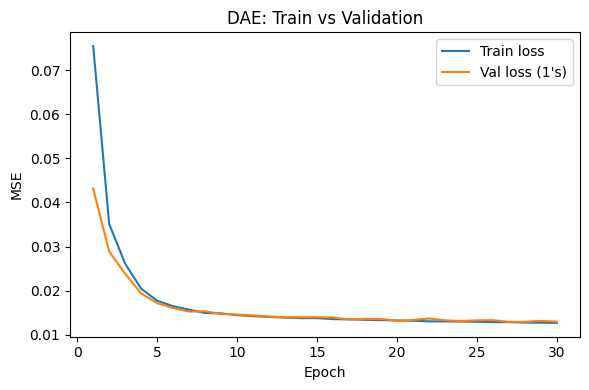

In [95]:
plt.figure(figsize=(6,4))
plt.plot(range(1, epochs+1), train_losses, label="Train loss")
plt.plot(range(1, epochs+1), val_losses,   label="Val loss (1's)")
plt.xlabel("Epoch")
plt.ylabel("MSE")
plt.title("DAE: Train vs Validation")
plt.legend()
plt.tight_layout()
plt.show()

In [96]:
import torch, matplotlib.pyplot as plt
import numpy as np

@torch.no_grad()
def show_recons_by_class(
    model, loader, device,
    class_order=(1,3), per_class=5,
    noise_std=0.25, seed=None, title=None,
    row_labels=("original", "recon", "signal (clean)", "residual"),
    residual_against="clean",   # "clean" or "input"
):
    """
    Collects `per_class` examples per class in `class_order` and displays a 4-row grid.
    residual_against:
        - "clean": residuals & MSE/PSNR vs clean target (MNIST demo)
        - "input": residuals & MSE/PSNR vs the actual input (what you'll have in real data)
    """
    model.eval()

    # --- collect samples ---
    buckets = {c: [] for c in class_order}
    for imgs, labels in loader:
        for i in range(imgs.size(0)):
            lab = int(labels[i])
            if lab in buckets and len(buckets[lab]) < per_class:
                buckets[lab].append(imgs[i:i+1])  # keep batch dim
        if all(len(buckets[c]) >= per_class for c in class_order):
            break

    cols = sum(min(len(buckets[c]), per_class) for c in class_order)
    if cols == 0:
        raise RuntimeError("No samples for requested classes found in this loader.")

    clean_list, lab_list = [], []
    for c in class_order:
        take = buckets[c][:per_class]
        clean_list += take
        lab_list   += [c] * len(take)

    clean = torch.cat(clean_list, dim=0).to(device)   # (C,1,28,28)
    labs  = lab_list

    # --- noisy or clean input ---
    if noise_std and noise_std > 0:
        if seed is not None:
            g = torch.Generator(device=device).manual_seed(int(seed))
            noise = torch.randn(clean.shape, device=device, generator=g)
        else:
            noise = torch.randn(clean.shape, device=device)
        noisy = (clean + noise_std * noise).clamp(0, 1)
        row0 = f"{row_labels[0]} (noisy σ={noise_std})"
    else:
        noisy = clean
        row0 = f"{row_labels[0]} (clean)"

    # --- forward ---
    recon = model(noisy)

    # choose metric target
    if residual_against.lower() == "input":
        target = noisy
        row_labels = (row0, row_labels[1], "input (observed)", row_labels[3])
    else:
        target = clean
        row_labels = (row0, row_labels[1], "signal (clean)", row_labels[3])

    # metrics vs chosen target
    mse   = ((recon - target)**2).mean(dim=(1,2,3))
    psnr  = -10.0 * torch.log10(mse.clamp_min(1e-12))

    # --- plot grid (robust to C==1) ---
    C = clean.size(0)
    fig, axes = plt.subplots(4, C, figsize=(2.1*C, 8),
                             gridspec_kw={'wspace':0.05, 'hspace':0.15},
                             squeeze=False)

    col = 0
    for cls in class_order:
        count = sum(1 for l in labs if l == cls)
        if count == 0: 
            continue
        mid = col + (count-1)/2
        axes[0, int(mid)].set_title(f"class {cls}", fontsize=10, pad=12)

        for k in range(count):
            j = col + k
            axes[0, j].imshow(noisy[j, 0].detach().cpu().numpy(), cmap='gray');   axes[0, j].axis('off')
            axes[0, j].set_title(axes[0, j].get_title() +
                                 f"\nMSE {mse[j]:.4f} | PSNR {psnr[j]:.1f} dB", fontsize=8, pad=2)
            axes[1, j].imshow(recon[j, 0].detach().cpu().numpy(), cmap='gray');   axes[1, j].axis('off')
            axes[2, j].imshow(target[j, 0].detach().cpu().numpy(), cmap='gray');  axes[2, j].axis('off')
            resid = (target[j] - recon[j]).abs()[0].detach().cpu().numpy()
            axes[3, j].imshow(resid, cmap='magma');                                axes[3, j].axis('off')
        col += count

    # left-side row labels
    axes[0, 0].set_ylabel(row_labels[0], fontsize=12, rotation=90, labelpad=20)
    axes[1, 0].set_ylabel(row_labels[1], fontsize=12, rotation=90, labelpad=20)
    axes[2, 0].set_ylabel(row_labels[2], fontsize=12, rotation=90, labelpad=20)
    axes[3, 0].set_ylabel(row_labels[3], fontsize=12, rotation=90, labelpad=20)

    if title: fig.suptitle(title, y=0.98)
    plt.tight_layout(rect=[0,0,1,0.96])
    plt.show()



/tmp/ipykernel_3065300/3069085483.py:103: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,1,0.96])


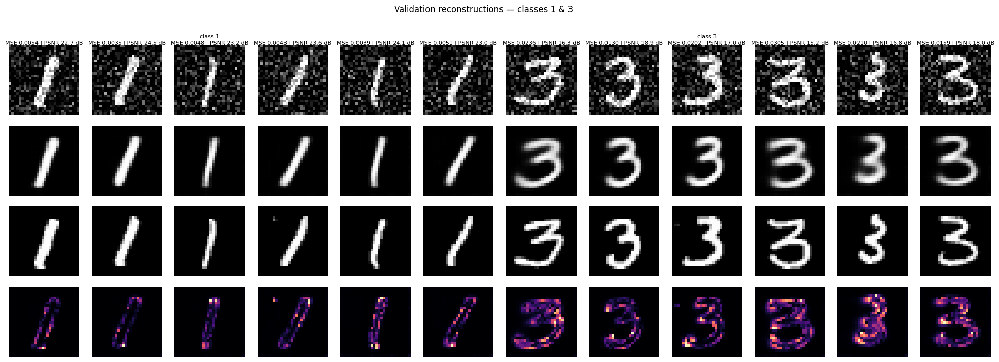

In [97]:
show_recons_by_class(model, val_loader_13, device,
                     class_order=(1,3), per_class=6,
                     noise_std=0.25, seed=123,
                     title="Validation reconstructions — classes 1 & 3")


/tmp/ipykernel_3065300/3069085483.py:103: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,1,0.96])


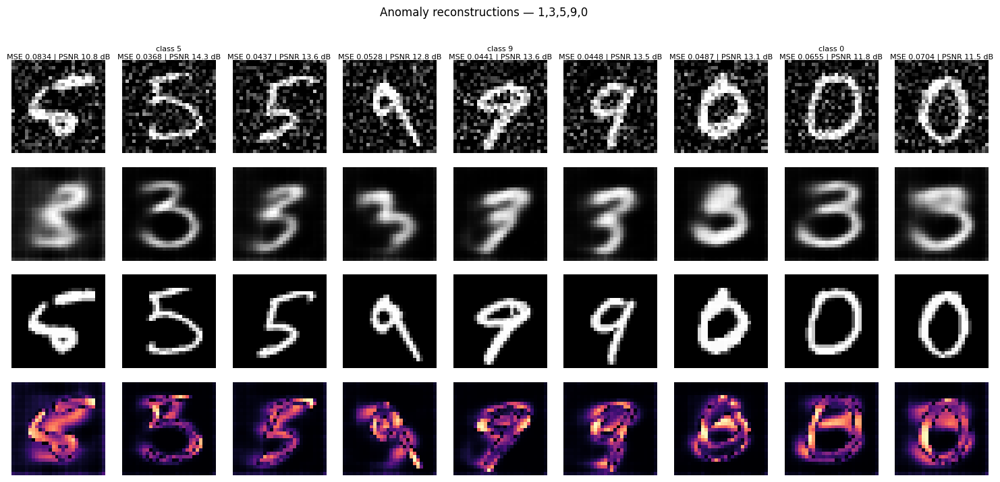

In [98]:
show_recons_by_class(model, test_loader_mix, device,
                     class_order=(5,9,0), per_class=3,
                     noise_std=0.25, seed=123,
                     title="Anomaly reconstructions — 1,3,5,9,0")


In [99]:
import numpy as np, torch
import matplotlib.pyplot as plt

@torch.no_grad()
def collect_id_stats(model, loader_id, device, noise_std_eval=None, eps=1e-6):
    """
    Calibrate on in-distribution data (digits 1&3).
    Returns stats for latent Mahalanobis + residual energy baselines.
    We only use x (observed); no clean target is required anywhere.
    """
    model.eval()
    Z, res_energy = [], []
    # running per-pixel residual moments (for whitening)
    n_pix = None
    sum_res = None
    sum_res2 = None

    for x, _ in loader_id:
        x = x.to(device)
        x_in = x if (not noise_std_eval or noise_std_eval == 0) \
                else (x + noise_std_eval * torch.randn(x.shape, device=device)).clamp(0,1)

        z = model.encode(x_in)
        x_hat = model.decode(z)
        r = (x_in - x_hat)                        # residual vs *input* (what you'll have at test time)
        re = (r**2).mean(dim=(1,2,3))             # residual energy per sample

        Z.append(z.detach().cpu().numpy())
        res_energy.append(re.detach().cpu().numpy())

        # accumulate per-pixel stats
        r_cpu = r.detach().cpu()
        if sum_res is None:
            sum_res  = r_cpu.sum(dim=0)           # (1,1,28,28)
            sum_res2 = (r_cpu**2).sum(dim=0)
            n_pix    = r_cpu.shape[0]
        else:
            sum_res  += r_cpu.sum(dim=0)
            sum_res2 += (r_cpu**2).sum(dim=0)
            n_pix    += r_cpu.shape[0]

    Z  = np.concatenate(Z, axis=0)           # (N_id, d)
    RE = np.concatenate(res_energy, axis=0)  # (N_id,)

    # latent Gaussian
    mu_z = Z.mean(axis=0, keepdims=True)
    C    = np.cov(Z, rowvar=False)
    C   += eps * np.eye(C.shape[0])
    Cinv = np.linalg.inv(C)

    # Mahalanobis baseline (z-score later)
    from numpy.linalg import multi_dot
    md_id = np.einsum('nd,dd,nd->n', Z - mu_z, Cinv, Z - mu_z)
    md_mu, md_std = md_id.mean(), md_id.std() + 1e-12

    # residual energy baseline (vs input)
    re_mu, re_std = RE.mean(), RE.std() + 1e-12

    # per-pixel whitening parameters
    mu_r  = (sum_res / n_pix).numpy()
    var_r = (sum_res2 / n_pix).numpy() - mu_r**2
    std_r = np.sqrt(np.maximum(var_r, 1e-10))

    return {
        "mu_z": mu_z, "Cinv": Cinv,
        "md_mu": md_mu, "md_std": md_std,
        "re_mu": re_mu, "re_std": re_std,
        "mu_r": mu_r, "std_r": std_r
    }

@torch.no_grad()
def score_loader(model, loader, device, stats, noise_std_eval=None):
    """
    Scores each sample with:
      - md: Mahalanobis distance in latent
      - md_z: z-scored md using ID calibration
      - re: residual energy vs input
      - re_z: z-scored residual energy
      - chi2: whitened residual chi-square (approximate)
    Returns arrays and labels.
    """
    model.eval()
    mu_z, Cinv = stats["mu_z"], stats["Cinv"]
    md_mu, md_std = stats["md_mu"], stats["md_std"]
    re_mu, re_std = stats["re_mu"], stats["re_std"]
    mu_r, std_r = stats["mu_r"], stats["std_r"]

    all_md, all_md_z, all_re, all_re_z, all_chi2, all_y = [], [], [], [], [], []

    for x, y in loader:
        x = x.to(device)
        x_in = x if (not noise_std_eval or noise_std_eval == 0) \
                else (x + noise_std_eval * torch.randn(x.shape, device=device)).clamp(0,1)

        z = model.encode(x_in)                         # (B,d)
        x_hat = model.decode(z)
        r = x_in - x_hat                                # residual vs input
        re = (r**2).mean(dim=(1,2,3))                  # residual energy per sample

        z_np  = z.detach().cpu().numpy()
        d     = z_np - mu_z
        md    = np.einsum('nd,dd,nd->n', d, Cinv, d)   # Mahalanobis^2
        md_z  = (md - md_mu) / md_std
        re_np = re.detach().cpu().numpy()
        re_z  = (re_np - re_mu) / re_std

        # whitened residual chi-square (approximate; pixels i.i.d. after whitening)
        r_np = r.detach().cpu().numpy()                # (B,1,28,28)
        chi2 = (((r_np - mu_r) / (std_r + 1e-12))**2).sum(axis=(1,2,3))

        all_md.append(md); all_md_z.append(md_z)
        all_re.append(re_np); all_re_z.append(re_z)
        all_chi2.append(chi2); all_y.append(y.numpy())

    return {
        "md":   np.concatenate(all_md),
        "md_z": np.concatenate(all_md_z),
        "re":   np.concatenate(all_re),
        "re_z": np.concatenate(all_re_z),
        "chi2": np.concatenate(all_chi2),
        "y":    np.concatenate(all_y)
    }

def plot_score_hist(scores, labels, class_order, key, title):
    """Small helper to visualize score histograms per class."""
    plt.figure(figsize=(7,4))
    for lab in class_order:
        mask = labels == lab
        if mask.any():
            plt.hist(scores[mask], bins=60, density=True, histtype='step', linewidth=1.5, label=str(lab))
    plt.xlabel(key); plt.ylabel('density'); plt.title(title); plt.legend()
    plt.tight_layout(); plt.show()


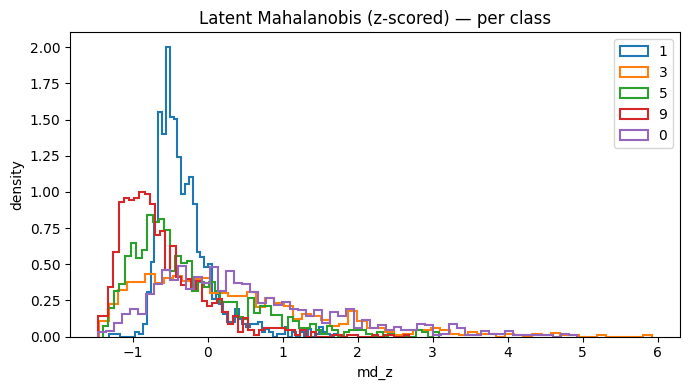

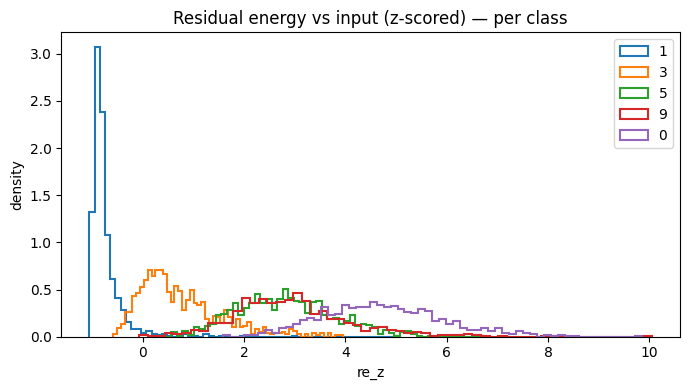

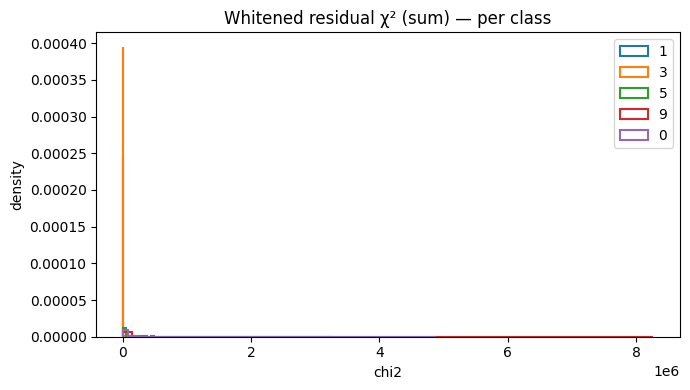

In [100]:
# 1) Calibrate on in-distribution (1 & 3) — use the same eval noise you expect at test.
stats = collect_id_stats(model, val_loader_13, device, noise_std_eval=None)

# 2) Score the mixed test set (no clean target needed)
scores = score_loader(model, test_loader_mix, device, stats, noise_std_eval=None)

# 3) Visualize/threshold
labs = scores["y"]
for key, nice in [("md_z", "Latent Mahalanobis (z-scored)"),
                  ("re_z", "Residual energy vs input (z-scored)"),
                  ("chi2", "Whitened residual χ² (sum)")]:
    plot_score_hist(scores[key], labs, class_order=[1,3,5,9,0],
                    title=f"{nice} — per class", key=key)


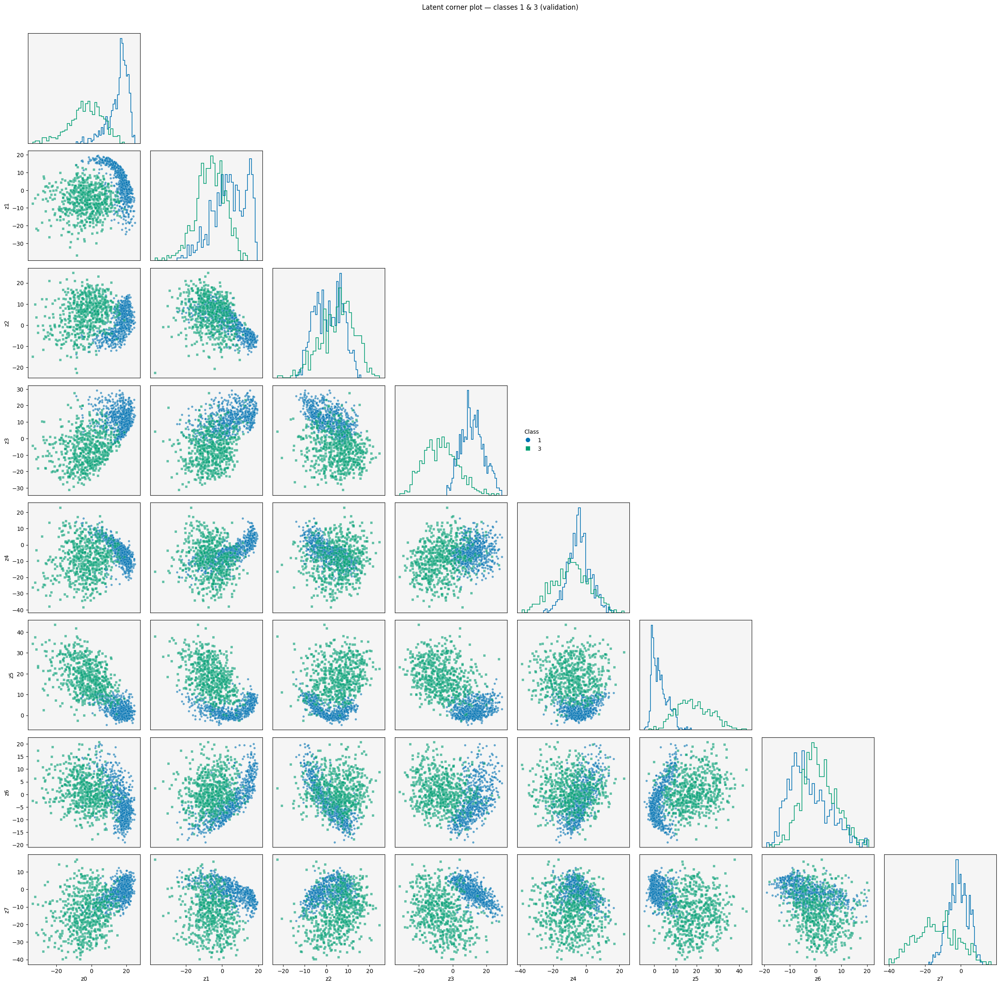

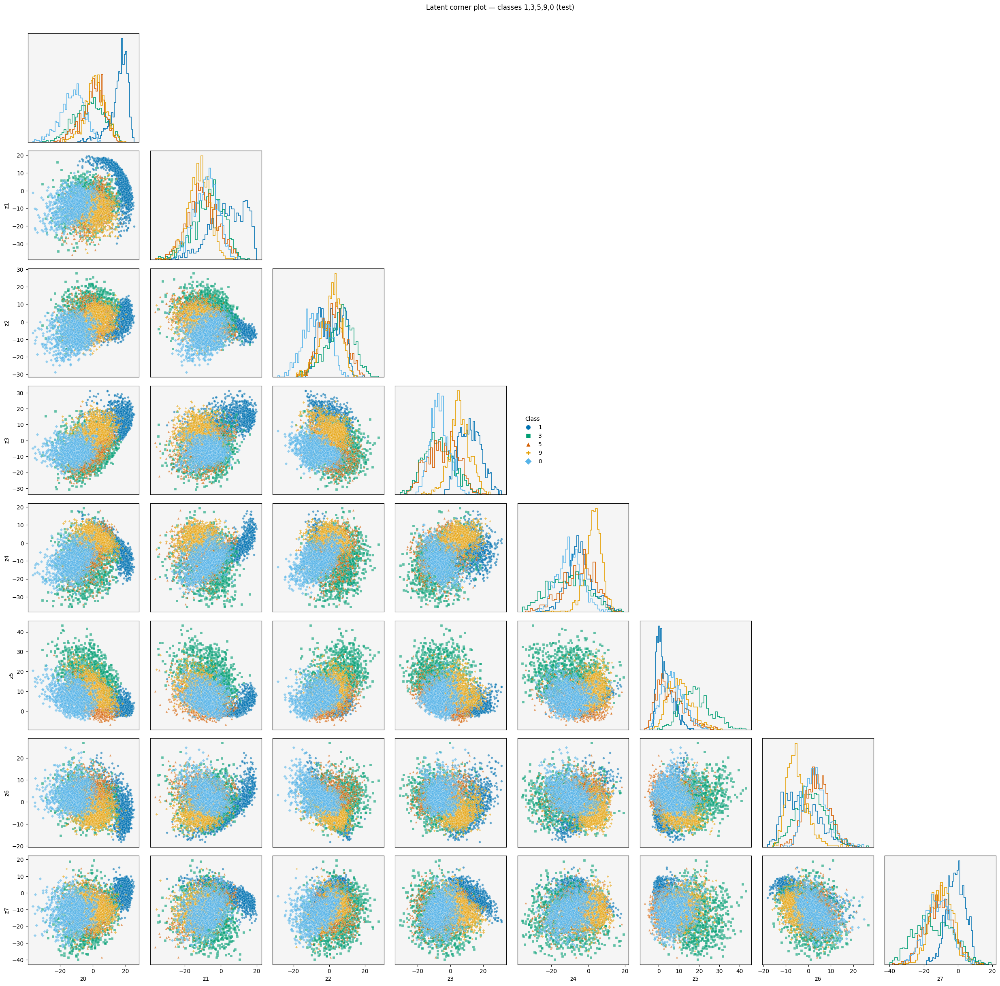

In [101]:
import numpy as np, torch, matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# ─────────────────────────────────────────────────────────────────────────────
# 1) Collect latents from a DataLoader (optionally add noise to inputs)
# ─────────────────────────────────────────────────────────────────────────────
@torch.no_grad()
def collect_latents(model, loader, device, noise_std=None, max_per_class=None, seed=0):
    model.eval()
    rng = np.random.default_rng(int(seed))

    Zs, Ls = [], []
    kept = {} if max_per_class is not None else None

    for x, y in loader:
        x = x.to(device)
        if noise_std is not None and noise_std > 0:
            noise = torch.randn(x.shape, device=device)  # avoid generator kw for compatibility
            x = (x + noise_std * noise).clamp(0, 1)

        z = model.encode(x).detach().cpu().numpy()
        y = y.detach().cpu().numpy()

        if kept is not None:
            mask = np.zeros_like(y, dtype=bool)
            for lab in np.unique(y):
                idx = np.where(y == lab)[0]
                left = max(0, max_per_class - kept.get(lab, 0))
                if left > 0:
                    if len(idx) > left:
                        idx = rng.choice(idx, size=left, replace=False)
                    mask[idx] = True
                    kept[lab] = kept.get(lab, 0) + len(idx)
            z, y = z[mask], y[mask]

        Zs.append(z); Ls.append(y)

    Z = np.concatenate(Zs, axis=0)
    labels = np.concatenate(Ls, axis=0)
    return Z, labels

# ─────────────────────────────────────────────────────────────────────────────
# 2) Corner plot (scatter-matrix) coloured by class
# ─────────────────────────────────────────────────────────────────────────────
def corner_plot_by_class(Z, labels, class_order=None, bins=40, subsample=10_000,
                         title=None, savepath=None):
    """
    Z: (N, d) numpy array
    labels: (N,) ints (e.g., digits)
    class_order: sequence of labels to plot order & legend order; if None uses sorted unique
    """
    Z = np.asarray(Z); labels = np.asarray(labels)
    N, d = Z.shape
    dim_labels = [f"z{i}" for i in range(d)]

    uniq = np.unique(labels).tolist()
    if class_order is None:
        class_order = sorted(uniq)
    else:
        class_order = [c for c in class_order if c in uniq]

    # Okabe–Ito palette (CVD-safe)
    OI = ["#0072B2", "#009E73", "#D55E00", "#E69F00", "#56B4E9",
          "#CC79A7", "#000000", "#F0E442", "#999999", "#009E73"]
    # map label -> colour/marker
    colour_map = {lab: OI[i % len(OI)] for i, lab in enumerate(class_order)}
    markers = ["o","s","^","P","D","X","v","<",">","*"]
    marker_map = {lab: markers[i % len(markers)] for i, lab in enumerate(class_order)}

    def c(lbl): return colour_map.get(lbl, "#666666")
    def m(lbl): return marker_map.get(lbl, "o")

    fig, axes = plt.subplots(d, d, figsize=(3.1 * d, 3.1 * d),
                             subplot_kw={'facecolor': 'whitesmoke'})
    plt.subplots_adjust(wspace=0.05, hspace=0.05)

    rng = np.random.default_rng(0)

    for i in range(d):
        for j in range(d):
            ax = axes[i, j]

            if i == j:
                # Diagonal: per-class density hist (step)
                for lab in class_order:
                    data_i = Z[labels == lab, i]
                    if data_i.size == 0:
                        continue
                    ax.hist(data_i, bins=bins, density=True, histtype='step',
                            color=c(lab), linewidth=1.2)
                ax.set_ylabel(''); ax.set_yticks([])

            elif i > j:
                # Lower triangle: scatter per class (with subsampling for speed)
                for lab in class_order:
                    idx = np.where(labels == lab)[0]
                    if idx.size == 0:
                        continue
                    if idx.size > subsample:
                        idx = rng.choice(idx, size=subsample, replace=False)
                    ax.scatter(Z[idx, j], Z[idx, i],
                               s=10 if len(idx) >= subsample else 16,
                               alpha=0.25 if len(idx) >= subsample else 0.6,
                               color=c(lab), marker=m(lab),
                               edgecolors='white', linewidths=0.25,
                               rasterized=True, zorder=3)
            else:
                ax.axis('off')

            # Outer labels only
            if i == d - 1 and j <= i:
                ax.set_xlabel(dim_labels[j])
            else:
                ax.set_xticks([])
            if j == 0 and i != 0:
                ax.set_ylabel(dim_labels[i])
            else:
                ax.set_yticks([])

    # Legend in a safe cell
    legend_row, legend_col = min(3, d-1), min(4, d-1)
    legend_ax = axes[legend_row, legend_col]
    legend_ax.axis('off')
    handles = [Line2D([], [], linestyle='', marker=m(lab), markersize=9,
                      markeredgecolor='white', color=c(lab), label=str(lab))
               for lab in class_order]
    legend_ax.legend(handles=handles, title='Class', loc='center left',
                     bbox_to_anchor=(0.0, 0.5), frameon=False, ncol=1)

    if title: fig.suptitle(title, y=0.98)
    plt.tight_layout(rect=[0,0,1,0.97])
    if savepath:
        plt.savefig(savepath, bbox_inches='tight')
    plt.show()

# ─────────────────────────────────────────────────────────────────────────────
# 3) Example usage with your loaders
# ─────────────────────────────────────────────────────────────────────────────

# a) Validation (classes 1 & 3)
Z_val, y_val = collect_latents(model, val_loader_13, device, noise_std=None, max_per_class=None)
corner_plot_by_class(
    Z_val, y_val, class_order=[1, 3],
    title="Latent corner plot — classes 1 & 3 (validation)",
    savepath="corner_latent_val_13.pdf"
)

# b) Test mix (classes 1,3,5,9,0)
Z_test, y_test = collect_latents(model, test_loader_mix, device, noise_std=None, max_per_class=20_000)
corner_plot_by_class(
    Z_test, y_test, class_order=[1, 3, 5, 9, 0],
    title="Latent corner plot — classes 1,3,5,9,0 (test)",
    savepath="corner_latent_test_13590.pdf"
)


In [102]:
# fit per-class {1,3} Gaussians
def fit_gaussian(Z):
    mu = Z.mean(axis=0, keepdims=True)
    C  = np.cov(Z, rowvar=False) + 1e-6*np.eye(Z.shape[1])
    return mu, np.linalg.inv(C)

Z_val, y_val = collect_latents(model, val_loader_13, device, noise_std=None)
mu1, Cinv1 = fit_gaussian(Z_val[y_val==1])
mu3, Cinv3 = fit_gaussian(Z_val[y_val==3])

def md_min_to_13(Z):
    d1 = np.einsum('nd,dd,nd->n', Z-mu1, Cinv1, Z-mu1)
    d3 = np.einsum('nd,dd,nd->n', Z-mu3, Cinv3, Z-mu3)
    return np.minimum(d1, d3)


In [103]:
@torch.no_grad()
def residual_energy(model, loader, device):
    model.eval(); all_re, all_y, all_Z = [], [], []
    for x,y in loader:
        x = x.to(device)
        z = model.encode(x); xhat = model.decode(z)
        re = ((xhat - x)**2).mean(dim=(1,2,3)).detach().cpu().numpy()
        all_re.append(re); all_y.append(y.numpy()); all_Z.append(z.cpu().numpy())
    return np.concatenate(all_Z), np.concatenate(all_y), np.concatenate(all_re)


In [104]:
# 1) Compute calibration stats on validation {1,3} (held-out TRAIN split)
Z_val, y_val = collect_latents(model, val_loader_13, device)
mu1, Cinv1 = fit_gaussian(Z_val[y_val==1])
mu3, Cinv3 = fit_gaussian(Z_val[y_val==3])

def md_min_to_13(Z):
    d1 = np.einsum('nd,dd,nd->n', Z - mu1, Cinv1, Z - mu1)
    d3 = np.einsum('nd,dd,nd->n', Z - mu3, Cinv3, Z - mu3)
    return np.minimum(d1, d3)

# md baselines from VAL
md_val = md_min_to_13(Z_val)
md_mu, md_sd = md_val.mean(), md_val.std() + 1e-12

# residual-energy baselines from VAL (vs input)
_, _, re_mu, re_sd, _ = residual_energy_z(model, val_loader_13, device)

# 2) Score TEST set with those baselines
Z_test, y_test, re_test = residual_energy(model, test_loader_mix, device)
md13_test = md_min_to_13(Z_test)

md_z = (md13_test - md_mu) / md_sd
re_z = (re_test    - re_mu) / re_sd

# simple combo score (tune weights if you like)
score = md_z + 0.5 * re_z

from sklearn.metrics import roc_auc_score, average_precision_score
y_true = ~np.isin(y_test, [1,3])  # 1 for anomaly (5,9,0)
print("AUC:", roc_auc_score(y_true, score))
print("AP :", average_precision_score(y_true, score))



AUC: 0.8584795974591185
AP : 0.8802505598007531


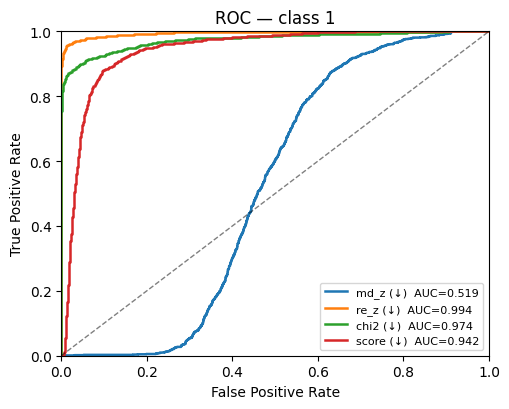

[skip] no samples with label 2 in the scored set.


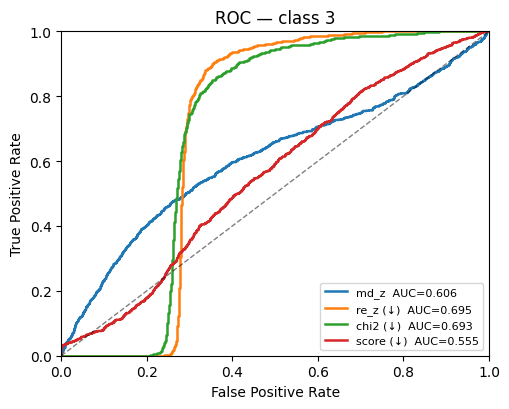

[skip] no samples with label 4 in the scored set.


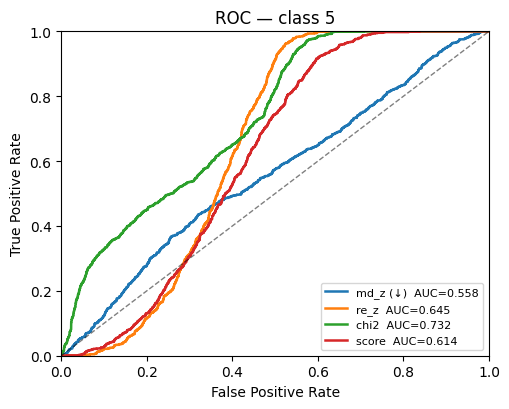

[skip] no samples with label 6 in the scored set.
[skip] no samples with label 7 in the scored set.
[skip] no samples with label 8 in the scored set.


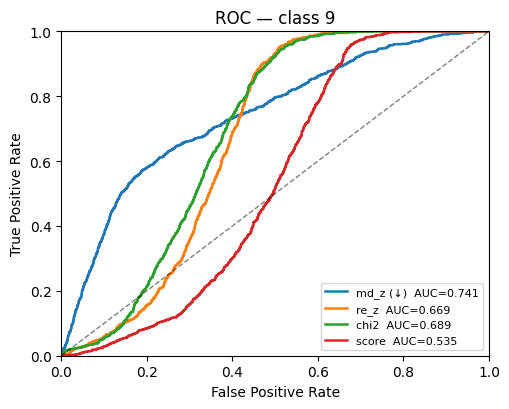

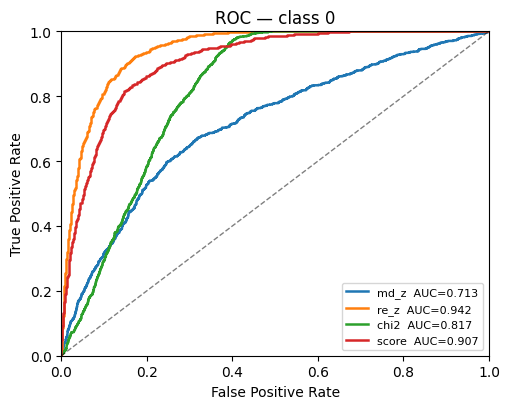

In [105]:
import numpy as np, torch, matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# --- If you haven't already run these earlier, keep them here -----------------
# collect_id_stats(...) and score_loader(...) from the earlier message
# (they calibrate on {1,3} and then score the mixed test set)
# ------------------------------------------------------------------------------

def plot_rocs_per_class(scores_dict, class_list=(1,2,3,4,5,6,7,8,9,0), title_prefix="ROC — class"):
    """
    scores_dict should come from score_loader(...):
      keys: "md_z", "re_z", "chi2", and optionally "score" (combo)
      plus "y" = labels
    Makes one figure per class with multiple curves (one per score).
    """
    y_all = scores_dict["y"]
    methods = []
    for key in ["md_z", "re_z", "chi2", "score"]:
        if key in scores_dict:
            methods.append(key)

    for cls in class_list:
        mask_pos = (y_all == cls)
        if mask_pos.sum() == 0:
            print(f"[skip] no samples with label {cls} in the scored set.")
            continue

        plt.figure(figsize=(5.2, 4.2))
        for key in methods:
            s = scores_dict[key].astype(float)

            # One-vs-rest ROC for this class
            y_true = mask_pos.astype(int)  # 1 for this class, 0 otherwise

            fpr, tpr, _ = roc_curve(y_true, s)
            A = auc(fpr, tpr)

            # Ensure we plot the "best" direction (purely for readability)
            flipped = False
            if A < 0.5:
                fpr, tpr, _ = roc_curve(y_true, -s)
                A = auc(fpr, tpr)
                flipped = True

            label = f"{key}{' (↓)' if flipped else ''}  AUC={A:.3f}"
            plt.plot(fpr, tpr, lw=1.8, label=label)

        plt.plot([0,1], [0,1], 'k--', lw=1, alpha=0.5)
        plt.xlim([0,1]); plt.ylim([0,1])
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title(f"{title_prefix} {cls}")
        plt.legend(loc="lower right", fontsize=8)
        plt.tight_layout()
        plt.show()


# ---------- Example end-to-end with your loaders --------------------------------
# 1) Calibrate on in-distribution ({1,3}) — no clean target required
stats = collect_id_stats(model, val_loader_13, device, noise_std_eval=None)

# 2) Score the mixed test set (1,3,5,9,0)
scores = score_loader(model, test_loader_mix, device, stats, noise_std_eval=None)

# 3) Add a simple combo score
scores["score"] = scores["md_z"] + 0.5 * scores["re_z"]

# 4) Plot ROCs — will auto-skip classes not present (e.g., 2,4)
plot_rocs_per_class(scores, class_list=(1,2,3,4,5,6,7,8,9,0), title_prefix="ROC — class")


In [106]:
import numpy as np, torch
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    accuracy_score, confusion_matrix, classification_report,
    roc_auc_score, average_precision_score
)

# ---------------------------
# 1) Latent collection helper
# ---------------------------
@torch.no_grad()
def collect_latents(model, loader, device):
    model.eval()
    Zs, ys = [], []
    for x, y in loader:
        x = x.to(device)
        z = model.encode(x).detach().cpu().numpy()   # (B, d)
        Zs.append(z)
        ys.append(y.numpy())
    return np.concatenate(Zs, 0), np.concatenate(ys, 0)

# ---------------------------
# 2) Fit classifier on {1,3}
# ---------------------------
X_val, y_val = collect_latents(model, val_loader_13, device)  # features: 8-d latent

# scikit-learn classifier (out-of-the-box)
clf = make_pipeline(
    StandardScaler(),
    LogisticRegression(max_iter=2000, solver="lbfgs")  # binary: labels 1 vs 3
)
clf.fit(X_val, y_val)

# ---------------------------
# 3) Calibrate anomaly threshold on {1,3}
#    - compute max class prob on validation {1,3}
#    - set tau so we only reject a small fraction of true {1,3}
# ---------------------------
val_probs  = clf.predict_proba(X_val)                  # shape (N, 2)
val_max_p  = val_probs.max(axis=1)

ID_REJECT_RATE = 0.01   # reject ~1% of true {1,3}; tweak to be stricter/looser
tau = np.quantile(val_max_p, ID_REJECT_RATE)
print(f"[calibration] probability threshold tau = {tau:.3f}  (reject rate ≈ {ID_REJECT_RATE*100:.1f}% on ID)")

# ---------------------------
# 4) Apply to test {1,3,5,9,0}
# ---------------------------
X_test, y_test = collect_latents(model, test_loader_mix, device)
test_probs  = clf.predict_proba(X_test)
test_pred12 = clf.classes_[np.argmax(test_probs, axis=1)]   # predicted {1 or 3}
test_max_p  = test_probs.max(axis=1)

# add "anomaly" when max prob < tau
ANOMY = -1
y_pred = np.where(test_max_p >= tau, test_pred12, ANOMY)

# ---------------------------
# 5) Metrics
# ---------------------------
id_mask  = np.isin(y_test, [1,3])
ood_mask = ~id_mask

# (a) ID accuracy among accepted (not flagged as anomaly)
accepted_id = (id_mask) & (y_pred != ANOMY)
id_acc = accuracy_score(y_test[accepted_id], y_pred[accepted_id]) if accepted_id.any() else float("nan")

# (b) ID coverage (how many ID samples we keep)
id_coverage = accepted_id.sum() / id_mask.sum()

# (c) Anomaly detection: treat anomaly=True for labels not in {1,3}
anom_true = ood_mask.astype(int)
anom_score = 1.0 - test_max_p                   # lower max_p ⇒ more anomalous
anom_auc  = roc_auc_score(anom_true, anom_score)
anom_ap   = average_precision_score(anom_true, anom_score)

# (d) Confusion over {1,3,anomaly}
label_map = {1:"1", 3:"3", ANOMY:"anomaly"}
def map_names(arr): return np.array([label_map.get(int(a), str(int(a))) for a in arr])
y_true_named = map_names(np.where(id_mask, y_test, ANOMY * np.ones_like(y_test)))  # collapse OOD to "anomaly" for display
y_pred_named = map_names(y_pred)

print("\n=== Results ===")
print(f"ID accuracy on accepted { {1,3} }: {id_acc:.3f}")
print(f"ID coverage (fraction of { {1,3} } not flagged anomaly): {id_coverage*100:.2f}%")
print(f"Anomaly AUC (flag 5/9/0 as anomaly): {anom_auc:.3f}")
print(f"Anomaly AP  (flag 5/9/0 as anomaly): {anom_ap:.3f}")

print("\nConfusion matrix over {1,3,anomaly} (true collapsed to {1,3} vs anomaly):")
print(confusion_matrix(y_true_named, y_pred_named, labels=["1","3","anomaly"]))

print("\nClassification report (note: true OOD collapsed to 'anomaly'):")
print(classification_report(y_true_named, y_pred_named, labels=["1","3","anomaly"]))


[calibration] probability threshold tau = 0.632  (reject rate ≈ 1.0% on ID)

=== Results ===
ID accuracy on accepted {1, 3}: 0.991
ID coverage (fraction of {1, 3} not flagged anomaly): 98.55%
Anomaly AUC (flag 5/9/0 as anomaly): 0.635
Anomaly AP  (flag 5/9/0 as anomaly): 0.714

Confusion matrix over {1,3,anomaly} (true collapsed to {1,3} vs anomaly):
[[1110    9   16]
 [  10  985   15]
 [ 182 2563  136]]

Classification report (note: true OOD collapsed to 'anomaly'):
              precision    recall  f1-score   support

           1       0.85      0.98      0.91      1135
           3       0.28      0.98      0.43      1010
     anomaly       0.81      0.05      0.09      2881

    accuracy                           0.44      5026
   macro avg       0.65      0.67      0.48      5026
weighted avg       0.71      0.44      0.34      5026



In [107]:
# 1) Calibrate ID-only stats for md_z & re_z
stats_id = collect_id_stats(model, val_loader_13, device, noise_std_eval=None)
val_scores = score_loader(model, val_loader_13, device, stats_id, noise_std_eval=None)

# 2) Train the same latent classifier on {1,3}
X_val, y_val = collect_latents(model, val_loader_13, device)
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
clf = make_pipeline(StandardScaler(),
                    LogisticRegression(max_iter=2000, solver="lbfgs"))
clf.fit(X_val, y_val)

# 3) Calibrate thresholds on ID (choose desired ID coverage, e.g., 95%)
import numpy as np
val_max_p = clf.predict_proba(X_val).max(axis=1)
tau_prob  = np.quantile(val_max_p, 0.05)          # reject worst 5% of ID on prob
tau_md    = np.quantile(val_scores["md_z"], 0.95) # reject worst 5% on md_z
tau_re    = np.quantile(val_scores["re_z"], 0.95) # reject worst 5% on re_z
print("τ_prob, τ_md, τ_re =", float(tau_prob), float(tau_md), float(tau_re))

# 4) Score the mixed test set and apply the AND-gate
X_test, y_test = collect_latents(model, test_loader_mix, device)
test_probs = clf.predict_proba(X_test)
test_pred  = clf.classes_[np.argmax(test_probs, axis=1)]
test_max_p = test_probs.max(axis=1)

test_scores = score_loader(model, test_loader_mix, device, stats_id, noise_std_eval=None)
gate = (test_max_p >= tau_prob) & (test_scores["md_z"] <= tau_md) & (test_scores["re_z"] <= tau_re)

ANOMY = -1
y_pred = np.where(gate, test_pred, ANOMY)

# 5) Metrics
from sklearn.metrics import roc_auc_score, average_precision_score, confusion_matrix, classification_report, accuracy_score
id_mask  = np.isin(y_test, [1,3])
ood_mask = ~id_mask

acc_id   = accuracy_score(y_test[id_mask & gate], y_pred[id_mask & gate]) if (id_mask & gate).any() else float('nan')
cov_id   = (id_mask & gate).sum() / id_mask.sum()
anom_auc = roc_auc_score(ood_mask.astype(int), 1.0 - test_max_p)  # just to report; the gate uses md_z/re_z too

print(f"ID acc (accepted): {acc_id:.3f}")
print(f"ID coverage: {100*cov_id:.2f}%")
print(f"Anomaly AUC (prob-only, for reference): {anom_auc:.3f}")

print("\nConfusion over {1,3,anomaly}:")
def map_name(a): return "anomaly" if a == ANOMY else str(int(a))
yt = np.array([map_name(a if a in (1,3) else ANOMY) for a in y_test])
yp = np.array([map_name(a) for a in y_pred])
print(confusion_matrix(yt, yp, labels=["1","3","anomaly"]))
print(classification_report(yt, yp, labels=["1","3","anomaly"]))


τ_prob, τ_md, τ_re = 0.8611547625582645 2.0972487962226083 1.9264302253723145
ID acc (accepted): 0.997
ID coverage: 88.81%
Anomaly AUC (prob-only, for reference): 0.635

Confusion over {1,3,anomaly}:
[[1081    2   52]
 [   3  819  188]
 [  23  207 2651]]
              precision    recall  f1-score   support

           1       0.98      0.95      0.96      1135
           3       0.80      0.81      0.80      1010
     anomaly       0.92      0.92      0.92      2881

    accuracy                           0.91      5026
   macro avg       0.90      0.89      0.90      5026
weighted avg       0.91      0.91      0.91      5026



SVM

In [108]:
import numpy as np, torch
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score, average_precision_score

# ---------- helpers ----------
@torch.no_grad()
def collect_latents(model, loader, device):
    model.eval()
    Zs, ys = [], []
    for x,y in loader:
        x = x.to(device)
        z = model.encode(x).detach().cpu().numpy()
        Zs.append(z); ys.append(y.numpy())
    return np.concatenate(Zs,0), np.concatenate(ys,0)

@torch.no_grad()
def residual_energy_z(model, loader, device, re_mu=None, re_std=None):
    """Compute residual energy vs *input*, and (optionally) z-score using ID stats."""
    model.eval()
    R, Y = [], []
    for x,y in loader:
        x = x.to(device)
        z = model.encode(x); xhat = model.decode(z)
        re = ((xhat - x)**2).mean(dim=(1,2,3)).detach().cpu().numpy()
        R.append(re); Y.append(y.numpy())
    re = np.concatenate(R,0); y = np.concatenate(Y,0)
    if re_mu is None or re_std is None:
        return re, y, re.mean(), re.std()+1e-12, (re - re.mean())/(re.std()+1e-12)
    else:
        return re, y, re_mu, re_std, (re - re_mu)/(re_std+1e-12)

def fit_gaussian(X, eps=1e-6):
    mu = X.mean(axis=0, keepdims=True)
    C  = np.cov(X, rowvar=False) + eps*np.eye(X.shape[1])
    Cinv = np.linalg.inv(C)
    return mu, Cinv

def md2(X, mu, Cinv):
    d = X - mu
    return np.einsum('nd,dd,nd->n', d, Cinv, d)

def fit_classifier(X, y, method='logreg'):
    if method == 'svm':
        # RBF SVM with probability calibration (Platt under the hood)
        clf = make_pipeline(StandardScaler(), SVC(kernel='rbf', probability=True, C=1.0, gamma='scale'))
    else:
        clf = make_pipeline(StandardScaler(), LogisticRegression(max_iter=2000, solver='lbfgs'))
    clf.fit(X, y)
    return clf

# ---------- 1) ID calibration on {1,3} ----------
X_id, y_id = collect_latents(model, val_loader_13, device)
# per-class Gaussians in latent
mu1, Cinv1 = fit_gaussian(X_id[y_id==1])
mu3, Cinv3 = fit_gaussian(X_id[y_id==3])

# min Mahalanobis distance to {1,3}
md_id = np.minimum(md2(X_id, mu1, Cinv1), md2(X_id, mu3, Cinv3))
md_mu, md_sd = md_id.mean(), md_id.std()+1e-12
md_id_z = (md_id - md_mu)/md_sd

# residual-energy stats (vs input) on ID
re_id, ytmp, re_mu, re_sd, re_id_z = residual_energy_z(model, val_loader_13, device)

# a small classifier just for deciding between 1 vs 3 on ID
clf = fit_classifier(X_id, y_id, method='svm')  # change to 'logreg' to use logistic instead
p_id = clf.predict_proba(X_id).max(axis=1)

# choose ID operating point (e.g., keep ~95% of ID)
ID_REJECT_RATE = 0.05
tau_prob = np.quantile(p_id, ID_REJECT_RATE)       # reject lowest 5% by prob
tau_md   = np.quantile(md_id_z, 1.0 - ID_REJECT_RATE) # reject highest 5% by md_min_z
tau_re   = np.quantile(re_id_z, 1.0 - ID_REJECT_RATE) # reject highest 5% by residual z
print(f"τ_prob={tau_prob:.3f}  τ_md={tau_md:.3f}  τ_re={tau_re:.3f}")

# ---------- 2) Apply to mixed test {1,3,5,9,0} ----------
X_te, y_te = collect_latents(model, test_loader_mix, device)
p_te = clf.predict_proba(X_te)
yhat_13 = clf.classes_[np.argmax(p_te, axis=1)]
pmax_te = p_te.max(axis=1)

# compute md_min_z and residual z on test
md_te = np.minimum(md2(X_te, mu1, Cinv1), md2(X_te, mu3, Cinv3))
md_te_z = (md_te - md_mu) / md_sd
_, _, _, _, re_te_z = residual_energy_z(model, test_loader_mix, device, re_mu=re_mu, re_std=re_sd)

# AND-gate
gate = (pmax_te >= tau_prob) & (md_te_z <= tau_md) & (re_te_z <= tau_re)
ANOMY = -1
y_pred = np.where(gate, yhat_13, ANOMY)

# ---------- 3) Metrics ----------
id_mask  = np.isin(y_te, [1,3])
ood_mask = ~id_mask

acc_id   = accuracy_score(y_te[id_mask & gate], y_pred[id_mask & gate]) if (id_mask & gate).any() else float('nan')
cov_id   = (id_mask & gate).sum() / id_mask.sum()

# anomaly quality (using prob-only score just for reference)
anom_score = 1.0 - pmax_te
anom_auc = roc_auc_score(ood_mask.astype(int), anom_score)
anom_ap  = average_precision_score(ood_mask.astype(int), anom_score)

print("\n=== Results (per-class Gaussians + AND gate) ===")
print(f"ID acc (accepted): {acc_id:.3f}")
print(f"ID coverage      : {100*cov_id:.2f}%")
print(f"Anomaly AUC (prob-only, ref): {anom_auc:.3f}")
print(f"Anomaly AP  (prob-only, ref): {anom_ap:.3f}")

def name(a): return "anomaly" if a == ANOMY else str(int(a))
yt = np.array([name(a if a in (1,3) else ANOMY) for a in y_te])
yp = np.array([name(a) for a in y_pred])
print("\nConfusion over {1,3,anomaly}:")
print(confusion_matrix(yt, yp, labels=["1","3","anomaly"]))
print("\nClassification report:")
print(classification_report(yt, yp, labels=["1","3","anomaly"]))


τ_prob=0.983  τ_md=1.772  τ_re=1.926

=== Results (per-class Gaussians + AND gate) ===
ID acc (accepted): 1.000
ID coverage      : 86.67%
Anomaly AUC (prob-only, ref): 0.542
Anomaly AP  (prob-only, ref): 0.688

Confusion over {1,3,anomaly}:
[[1001    0  134]
 [   0  858  152]
 [   9  184 2688]]

Classification report:
              precision    recall  f1-score   support

           1       0.99      0.88      0.93      1135
           3       0.82      0.85      0.84      1010
     anomaly       0.90      0.93      0.92      2881

    accuracy                           0.90      5026
   macro avg       0.91      0.89      0.90      5026
weighted avg       0.91      0.90      0.91      5026



LogReg

In [109]:
import numpy as np, torch
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score, average_precision_score

# ---------- helpers ----------
@torch.no_grad()
def collect_latents(model, loader, device):
    model.eval()
    Zs, ys = [], []
    for x,y in loader:
        x = x.to(device)
        z = model.encode(x).detach().cpu().numpy()
        Zs.append(z); ys.append(y.numpy())
    return np.concatenate(Zs,0), np.concatenate(ys,0)

@torch.no_grad()
def residual_energy_z(model, loader, device, re_mu=None, re_std=None):
    """Compute residual energy vs *input*, and (optionally) z-score using ID stats."""
    model.eval()
    R, Y = [], []
    for x,y in loader:
        x = x.to(device)
        z = model.encode(x); xhat = model.decode(z)
        re = ((xhat - x)**2).mean(dim=(1,2,3)).detach().cpu().numpy()
        R.append(re); Y.append(y.numpy())
    re = np.concatenate(R,0); y = np.concatenate(Y,0)
    if re_mu is None or re_std is None:
        return re, y, re.mean(), re.std()+1e-12, (re - re.mean())/(re.std()+1e-12)
    else:
        return re, y, re_mu, re_std, (re - re_mu)/(re_std+1e-12)

def fit_gaussian(X, eps=1e-6):
    mu = X.mean(axis=0, keepdims=True)
    C  = np.cov(X, rowvar=False) + eps*np.eye(X.shape[1])
    Cinv = np.linalg.inv(C)
    return mu, Cinv

def md2(X, mu, Cinv):
    d = X - mu
    return np.einsum('nd,dd,nd->n', d, Cinv, d)

def fit_classifier(X, y, method='logreg'):
    if method == 'svm':
        # RBF SVM with probability calibration (Platt under the hood)
        clf = make_pipeline(StandardScaler(), SVC(kernel='rbf', probability=True, C=1.0, gamma='scale'))
    else:
        clf = make_pipeline(StandardScaler(), LogisticRegression(max_iter=2000, solver='lbfgs'))
    clf.fit(X, y)
    return clf

# ---------- 1) ID calibration on {1,3} ----------
X_id, y_id = collect_latents(model, val_loader_13, device)
# per-class Gaussians in latent
mu1, Cinv1 = fit_gaussian(X_id[y_id==1])
mu3, Cinv3 = fit_gaussian(X_id[y_id==3])

# min Mahalanobis distance to {1,3}
md_id = np.minimum(md2(X_id, mu1, Cinv1), md2(X_id, mu3, Cinv3))
md_mu, md_sd = md_id.mean(), md_id.std()+1e-12
md_id_z = (md_id - md_mu)/md_sd

# residual-energy stats (vs input) on ID
re_id, ytmp, re_mu, re_sd, re_id_z = residual_energy_z(model, val_loader_13, device)

# a small classifier just for deciding between 1 vs 3 on ID
clf = fit_classifier(X_id, y_id, method='logreg')  # change to 'logreg' to use logistic instead
p_id = clf.predict_proba(X_id).max(axis=1)

# choose ID operating point (e.g., keep ~95% of ID)
ID_REJECT_RATE = 0.05
tau_prob = np.quantile(p_id, ID_REJECT_RATE)       # reject lowest 5% by prob
tau_md   = np.quantile(md_id_z, 1.0 - ID_REJECT_RATE) # reject highest 5% by md_min_z
tau_re   = np.quantile(re_id_z, 1.0 - ID_REJECT_RATE) # reject highest 5% by residual z
print(f"τ_prob={tau_prob:.3f}  τ_md={tau_md:.3f}  τ_re={tau_re:.3f}")

# ---------- 2) Apply to mixed test {1,3,5,9,0} ----------
X_te, y_te = collect_latents(model, test_loader_mix, device)
p_te = clf.predict_proba(X_te)
yhat_13 = clf.classes_[np.argmax(p_te, axis=1)]
pmax_te = p_te.max(axis=1)

# compute md_min_z and residual z on test
md_te = np.minimum(md2(X_te, mu1, Cinv1), md2(X_te, mu3, Cinv3))
md_te_z = (md_te - md_mu) / md_sd
_, _, _, _, re_te_z = residual_energy_z(model, test_loader_mix, device, re_mu=re_mu, re_std=re_sd)

# AND-gate
gate = (pmax_te >= tau_prob) & (md_te_z <= tau_md) & (re_te_z <= tau_re)
ANOMY = -1
y_pred = np.where(gate, yhat_13, ANOMY)

# ---------- 3) Metrics ----------
id_mask  = np.isin(y_te, [1,3])
ood_mask = ~id_mask

acc_id   = accuracy_score(y_te[id_mask & gate], y_pred[id_mask & gate]) if (id_mask & gate).any() else float('nan')
cov_id   = (id_mask & gate).sum() / id_mask.sum()

# anomaly quality (using prob-only score just for reference)
anom_score = 1.0 - pmax_te
anom_auc = roc_auc_score(ood_mask.astype(int), anom_score)
anom_ap  = average_precision_score(ood_mask.astype(int), anom_score)

print("\n=== Results (per-class Gaussians + AND gate) ===")
print(f"ID acc (accepted): {acc_id:.3f}")
print(f"ID coverage      : {100*cov_id:.2f}%")
print(f"Anomaly AUC (prob-only, ref): {anom_auc:.3f}")
print(f"Anomaly AP  (prob-only, ref): {anom_ap:.3f}")

def name(a): return "anomaly" if a == ANOMY else str(int(a))
yt = np.array([name(a if a in (1,3) else ANOMY) for a in y_te])
yp = np.array([name(a) for a in y_pred])
print("\nConfusion over {1,3,anomaly}:")
print(confusion_matrix(yt, yp, labels=["1","3","anomaly"]))
print("\nClassification report:")
print(classification_report(yt, yp, labels=["1","3","anomaly"]))


τ_prob=0.861  τ_md=1.772  τ_re=1.926

=== Results (per-class Gaussians + AND gate) ===
ID acc (accepted): 0.997
ID coverage      : 87.46%
Anomaly AUC (prob-only, ref): 0.635
Anomaly AP  (prob-only, ref): 0.714

Confusion over {1,3,anomaly}:
[[ 996    2  137]
 [   3  875  132]
 [  23  209 2649]]

Classification report:
              precision    recall  f1-score   support

           1       0.97      0.88      0.92      1135
           3       0.81      0.87      0.83      1010
     anomaly       0.91      0.92      0.91      2881

    accuracy                           0.90      5026
   macro avg       0.90      0.89      0.89      5026
weighted avg       0.90      0.90      0.90      5026



In [8]:
file_name = 'generated_data/first_20000_raw_data.npy'
data_shape_name = file_name.replace('.npy', '_shape.npy')
data_shape = np.load(data_shape_name)
data_shape = tuple(int(dim) for dim in data_shape)

data = np.memmap(file_name, dtype='float32', mode='r+', shape=data_shape)

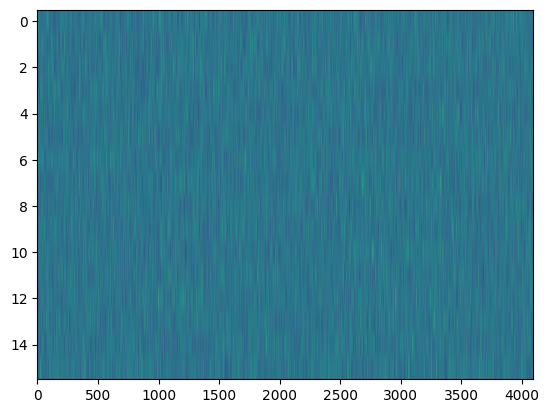

In [9]:
import matplotlib.pyplot as plt
plt.imshow(data[0,0],aspect="auto")
